# Error Analysis


In [1]:
%cd "~/projects/spartDM"
%load_ext autoreload
%autoreload 2

import os

print(f"Current working dir: {os.getcwd()}")

/home/kdang/projects/spartDM
Current working dir: /home/kdang/projects/spartDM


/home/kdang/projects/spartDM/.venv/lib/python3.10/site-packages/IPython/core/magics/osm.py:393: UserWarning: This is now an optional IPython functionality, using bookmarks requires you to install the `pickleshare` library.
  bkms = self.shell.db.get('bookmarks', {})
/home/kdang/projects/spartDM/.venv/lib/python3.10/site-packages/IPython/core/magics/osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [2]:
import numpy as np
from src.data.starmen import StarmenDataset
from monai.data import DataLoader
from src.sadm.utils import plot_multi_imgs
from src.utils.metrics import percnorm, ssim, mse, mae
import json
import torch
import torch.nn.functional as F
from monai.transforms import ScaleIntensity
from einops import rearrange
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec


/home/kdang/projects/spartDM/.venv/lib/python3.10/site-packages/generative/networks/layers/vector_quantizer.py:86: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  @torch.cuda.amp.autocast(enabled=False)
/home/kdang/projects/spartDM/.venv/lib/python3.10/site-packages/generative/networks/layers/vector_quantizer.py:124: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  @torch.cuda.amp.autocast(enabled=False)


### Constant variable and helper function

In [13]:
# Define constant variable

DATA_DIR = "data/starmen/output_random_noacc"
WORK_DIR = "workdir/diffae_starmen"
from src.utils import plot_comparison_starmen
from src.utils import plot_kde_pixel

# Helper function to quick plot a tensor using torchvision grid
def quick_plot_tensor(x, title):
    """
    x: torch.tensor of size(B, C, H, W)
    """
    grid = torchvision.utils.make_grid(x, nrow=10, normalize=True, padding=1)  # noqa: F821
    plt.figure(figsize=(16, 4))  
    plt.imshow(grid.permute(1, 2, 0).squeeze(), cmap='gray')
    plt.title(title)
    plt.axis("off")

In [ ]:

split = "darkerline50"

infer_dir = os.path.join(WORK_DIR, "infer", f"{split}_ddim100")


test_ds = StarmenDataset(
    data_dir=DATA_DIR,
    split=split,
    nb_subject=None,
)
test_loader = DataLoader(test_ds, batch_size=1, shuffle=True, num_workers=1)
print(f"Len of test dataset: {len(test_loader)}")


# Read the reconstruction error files to get the index and corresponding reonconstruction image
recons_idx_path = os.path.join(infer_dir, "results", "recons_idx.npy")
test_ids = np.load(recons_idx_path)
test_ids = test_ids.squeeze().tolist()


# Load the original (anomalious) image from test dataset by index
x_orgs = [test_ds.get_images_by_id(id).squeeze() for id in test_ids]
x_orgs = np.stack(x_orgs).astype("float32")

# Load the groundtruth anomaly mask 
gt_paths = test_ds.datas["gt_path"].unique()
x_ano_gts = []
for id in test_ids:
    gt_path = test_ds.datas[test_ds.datas["id"] == id]["gt_path"].unique().item()
    gt = np.load(gt_path)
    x_ano_gts.append(gt)
x_ano_gts = np.stack(x_ano_gts)
x_ano_gts.shape

# Load the original healthy images
# healthy path example= data/starmen/output_random_noacc/images/SimulatedData__Reconstruction__starman__subject_s0__tp_0.npy
x_hts = []
for id in test_ids:
    for t in range(0, 10):
        ht_path = os.path.join(DATA_DIR, "images", f"SimulatedData__Reconstruction__starman__subject_s{id}__tp_{t}.npy")
        ht = np.load(ht_path)
        x_hts.append(ht)
x_hts = np.stack(x_hts)
x_hts = rearrange(x_hts, "(b t) h w -> b t h w", t=10)
x_hts.shape

- Load the reconstruction images: we use 2 types of reconstruction: 

    - `recons_semantic`: DDIM samples from random normal `x_T` and use semantic encoder to guide the generative process.

    - `recons`: DDIM samples from inferred xT (which is a stochastic encoder of x0) and use semantic encoder to guide the process. 

In [205]:
# Load the recons_semantic: 
x_recons_semantic = np.load(os.path.join(infer_dir, "results", "recons_semantic.npy")).squeeze()
x_recons_semantic.shape


# Load the recons: 
x_recons = np.load(os.path.join(infer_dir, "results", "recons.npy")).squeeze()
x_recons.shape

# Calculate difference
x_diffs = np.abs(x_orgs - x_recons)
x_diffs_semantic = np.abs(x_orgs - x_recons)


### Plot reconstruction error 

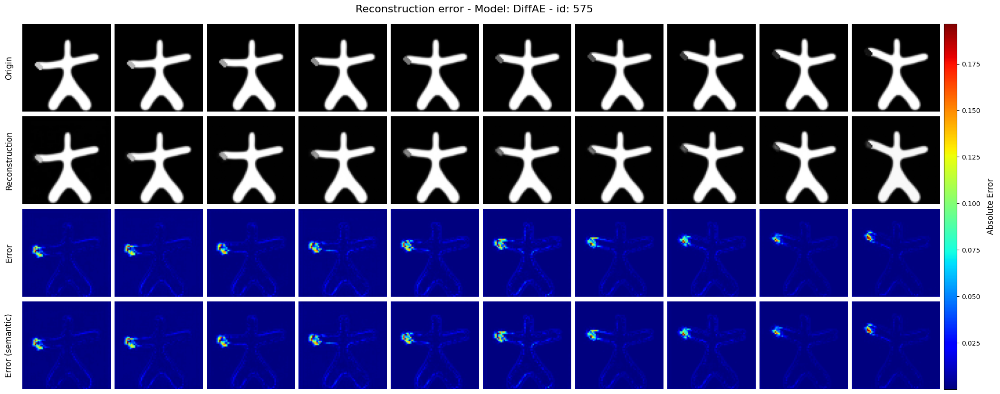

In [ ]:

# Calculate 99th percentile of error
# and use it as value-filter
from src.utils.metrics import error_filter
filter_perc = 99
filter_value = np.percentile(x_diffs, filter_perc)
x_diffs_filter = error_filter(x_diffs, filter_value)

# Choose 1 index for example
id = 2
img_org = x_orgs[id]
img_recons = x_recons[id]
img_diff = x_diffs[id]
img_diff_semantic = x_diffs_semantic[id]

imgs = [
    img_org, 
    img_recons,
    img_diff,
    img_diff
]

labels = [
    "Origin",
    "Reconstruction",
    "Error",
    "Error (semantic)"
]

title = f"Reconstruction error - Model: DiffAE - id: {test_ids[id]}"
opt={"title":title}

fig = plot_comparison_starmen(imgs, labels, is_errors=[False, False, True, True], opt=opt)

## Plot histogram error

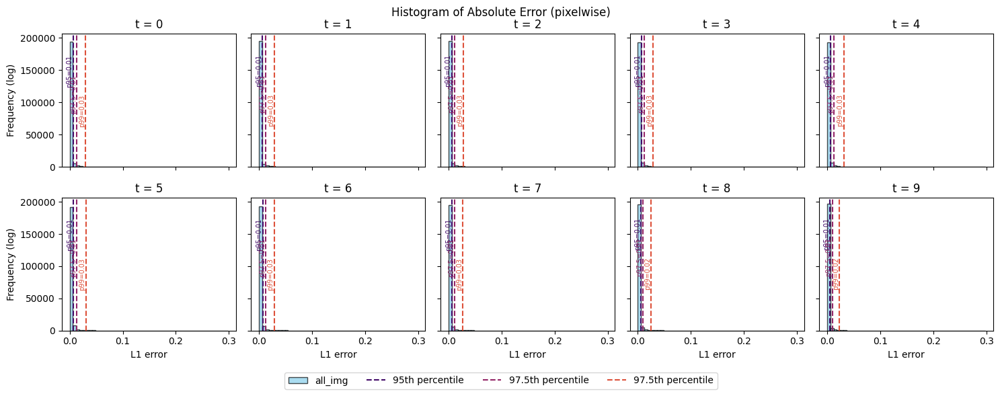

In [207]:
import numpy as np
from src.utils import plot_error_histogram



# Calculate histogram of error for each timeline

diff_t = rearrange(x_diffs, "b t h w -> t (b h w)")

fig = plot_error_histogram(
    diff_t,
    opt={"title": "Histogram of Absolute Error (pixelwise)"}
)

/tmp/ipykernel_5230/687305852.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='upper right')


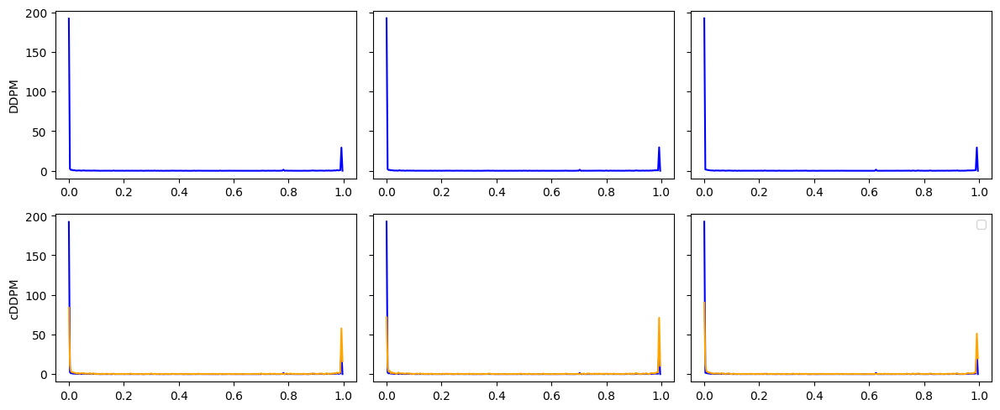

In [208]:
def compute_histogram(image_batch, bins=256, range=(0.0, 1.0)):
    flattened = image_batch.flatten()
    hist, bin_edges = np.histogram(flattened, bins=bins, range=range, density=True)
    return hist, bin_edges


# from scipy.stats import entropy

# def compute_kld(p, q, eps=1e-8):
#     p = p + eps  # Avoid zeros
#     q = q + eps
#     return entropy(p, q)

import matplotlib.pyplot as plt

def plot_comparison(input_imgs, recon_cddpm, contrasts=['Original', '0.5', '2']):
    fig, axes = plt.subplots(2, len(contrasts), figsize=(12, 5), sharey=True)
    
    for i, contrast in enumerate(contrasts):
        # Compute histograms
        h_input, bins = compute_histogram(input_imgs[i])
        h_cddpm, _ = compute_histogram(recon_cddpm[i])

        # # KLD
        # kld_ddpm = compute_kld(h_input, h_ddpm)
        # kld_cddpm = compute_kld(h_input, h_cddpm)

        # Plot DDPM (row 0)
        axes[0, i].plot(bins[:-1], h_input, color='blue', label='Input')
        # axes[0, i].plot(bins[:-1], h_ddpm, color='orange', label='DDPM')
        # axes[0, i].set_title(f"{contrast}\nKLD={kld_ddpm:.3f}")
        if i == 0: axes[0, i].set_ylabel("DDPM")

        # Plot cDDPM (row 1)
        axes[1, i].plot(bins[:-1], h_input, color='blue')
        axes[1, i].plot(bins[:-1], h_cddpm, color='orange')
        # axes[1, i].set_title(f"KLD={kld_cddpm:.3f}")
        if i == 0: axes[1, i].set_ylabel("cDDPM")

    plt.tight_layout()
    plt.legend(loc='upper right')
    plt.show()

plot_comparison(img_org, img_recons)


## Compute metrics

In [209]:
import torch.nn as nn
from src.utils.metrics import get_eval_dictionary
# prepare eval dict

eval_dict = get_eval_dictionary()
eval_dict.keys()

dict_keys(['IDs', 'x', 'reconstructions', 'diffs', 'diffs_volume', 'Segmentation', 'reconstructionTimes', 'latentSpace', 'Age', 'AgeGroup', 'l1reconstructionErrors', 'l1recoErrorAll', 'l1recoErrorUnhealthy', 'l1recoErrorHealthy', 'l2recoErrorAll', 'l2recoErrorUnhealthy', 'l2recoErrorHealthy', 'l1reconstructionErrorMean', 'l1reconstructionErrorStd', 'l2reconstructionErrors', 'l2reconstructionErrorMean', 'l2reconstructionErrorStd', 'HausPerVol', 'TPPerVol', 'FPPerVol', 'FNPerVol', 'TNPerVol', 'TPRPerVol', 'FPRPerVol', 'TPTotal', 'FPTotal', 'FNTotal', 'TNTotal', 'TPRTotal', 'FPRTotal', 'PrecisionPerVol', 'RecallPerVol', 'PrecisionPerSlice', 'RecallPerSlice', 'lesionSizePerSlice', 'lesionSizePerVol', 'Dice', 'DiceScorePerSlice', 'DiceScorePerVol', 'BestDicePerVol', 'BestThresholdPerVol', 'AUCPerVol', 'AUPRCPerVol', 'SpecificityPerVol', 'AccuracyPerVol', 'TPgradELBO', 'FPgradELBO', 'FNgradELBO', 'TNgradELBO', 'TPRgradELBO', 'FPRgradELBO', 'DicegradELBO', 'DiceScorePerVolgradELBO', 'BestDice

In [210]:
# Get the reconstruction images for each nb of steps

for i in range(len(x_orgs)):

    data_recon = torch.from_numpy(x_recons[i])
    data_orig = torch.from_numpy(x_orgs[i])
    data_seg = torch.from_numpy(x_ano_gts[i])
    data_seg[data_seg > 0] = 1
    eval_dict["IDs"].append(test_ids[i]) 

    l1err = nn.functional.l1_loss(data_recon.squeeze(),data_orig.squeeze())
    l2err = nn.functional.mse_loss(data_recon.squeeze(),data_orig.squeeze())
    l1err_anomal = nn.functional.l1_loss(data_recon.squeeze()[data_seg.squeeze() > 0],data_orig[data_seg > 0]) 
    l1err_healthy = nn.functional.l1_loss(data_recon.squeeze()[data_seg.squeeze() == 0],data_orig[data_seg == 0]) 
    l2err_anomal = nn.functional.mse_loss(data_recon.squeeze()[data_seg.squeeze() > 0],data_orig[data_seg > 0]) 
    l2err_healthy = nn.functional.mse_loss(data_recon.squeeze()[data_seg.squeeze() == 0],data_orig[data_seg == 0])

    # store in eval dict
    eval_dict['l1recoErrorAll'].append(l1err.item())
    eval_dict['l1recoErrorUnhealthy'].append(l1err_anomal.item())
    eval_dict['l1recoErrorHealthy'].append(l1err_healthy.item())
    eval_dict['l2recoErrorAll'].append(l2err.item())
    eval_dict['l2recoErrorUnhealthy'].append(l2err_anomal.item())
    eval_dict['l2recoErrorHealthy'].append(l2err_healthy.item())


In [ ]:

ddim_var = ["50step", "100step", "250step", "500step"]

all_results = []

for v in ddim_var:

    result = {"method": v}

    eval_error_path = os.path.join(WORK_DIR, f"evals_errors_{v}.json")
    with open(eval_error_path, "r") as f:
        eval_error = json.load(f)

    test_ids = [i["id"] for i in eval_error]

    # Get x origin that follows index of test_ids
    x_orgs = [test_ds.get_images_by_id(id).squeeze() for id in test_ids]
    x_orgs = np.stack(x_orgs)

    # Get reconstruction image
    x_recons_path = os.path.join(WORK_DIR, f"x_recons_{v}.npy")
    x_recons = np.load(x_recons_path)

    # Calculate metric
    t_x_orgs = torch.from_numpy(x_orgs)
    t_x_recons = torch.from_numpy(x_recons)

    mean_mse, sd_mse, _ = mse(t_x_orgs, t_x_recons)
    mean_mae, sd_mae, _ = mae(t_x_orgs, t_x_recons)

    # Calculate SSIM metrics
    # Since SSIM requires x and x_recons have the same data_range, we will rescale x_recons to [0, 1]
    # also, we apply the clipping of 5% and 95% percentile to x_recons

    scale = ScaleIntensity(0, 1)
    x_recons_norm = scale(x_recons).numpy()
    x_recons_norm = percnorm(x_recons_norm, 5, 95)
    t_x_recons_norm = torch.from_numpy(x_recons_norm)

    ssim_all = ssim(
        rearrange(t_x_orgs, "b t h w -> (b t) 1 h w"),
        rearrange(t_x_recons, "b t h w -> (b t) 1 h w")
    )

    # write resule
    result["mean_ssim"] = np.mean(ssim_all)
    result["max_ssim"] = np.max(ssim_all)
    result["sd_ssim"] = np.std(ssim_all)
    result["mean_mse"] = mean_mse.item()
    result["sd_mse"] = sd_mse.item()
    result["mean_mae"] = mean_mae.item()
    result["sd_mae"] = sd_mae.item()

    all_results.append(result)

    

In [ ]:
import pandas as pd


df = pd.DataFrame(all_results)
print(df)

csv_path = os.path.join(WORK_DIR, "metrics_summary.csv")
df.to_csv(csv_path, index=False) 


    method  mean_ssim  max_ssim   sd_ssim  mean_mse    sd_mse  mean_mae  \
0   50step   0.945531  0.997767  0.044143  0.003651  0.005714  0.014734   
1  100step   0.941372  0.998222  0.049418  0.003748  0.005718  0.015573   
2  250step   0.626122  0.990827  0.236446  0.009302  0.009009  0.048504   
3  500step   0.509220  0.985161  0.200003  0.015265  0.009550  0.068388   

     sd_mae  
0  0.008548  
1  0.008819  
2  0.028376  
3  0.026858  


## Load pretrained model

In [5]:
## Load model
ckpt_path = os.path.join(WORK_DIR, "representation-learning", "checkpoints", "best.ckpt")

from src.ldae import CondDDPM
import torchvision


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

litmodel = CondDDPM.load_from_checkpoint(ckpt_path, map_location=device)
ema_encoder = litmodel.ema_encoder
ema_encoder.eval()
ema_decoder = litmodel.ema_decoder
ema_decoder.eval()
gaussian_diffusion = litmodel.gaussian_diffusion

Backbone model loaded successfully.
Frozen first 0 layers out of 161 in the backbone



In [6]:
# Model summary
from lightning.pytorch.utilities.model_summary import ModelSummary

summary = ModelSummary(litmodel, max_depth=2)
print(summary)

   | Name                      | Type               | Params | Mode 
--------------------------------------------------------------------------
0  | decoder                   | CondUNet           | 2.5 M  | train
1  | decoder.time_embed        | Sequential         | 20.7 K | train
2  | decoder.label_emb         | Linear             | 65.7 K | train
3  | decoder.input_blocks      | ModuleList         | 517 K  | train
4  | decoder.middle_block      | TimestepSequential | 469 K  | train
5  | decoder.output_blocks     | ModuleList         | 1.4 M  | train
6  | decoder.out               | Sequential         | 353    | train
7  | encoder                   | SemanticEncoder    | 24.6 M | train
8  | encoder.backbone          | BackboneBaseModule | 24.6 M | train
9  | ema_encoder               | SemanticEncoder    | 24.6 M | eval 
10 | ema_encoder.backbone      | BackboneBaseModule | 24.6 M | eval 
11 | ema_decoder               | CondUNet           | 2.5 M  | eval 
12 | ema_decoder.time_embed 

# Scenario 1: subtle anomaly

Here we will investigate how our model handles subtle anomaly. We will load the test dataset `darkerline`

### Sample from healthy image


sampling loop time step: 100%|██████████| 100/100 [00:36<00:00,  2.76it/s]


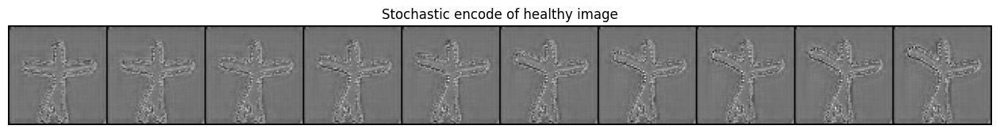

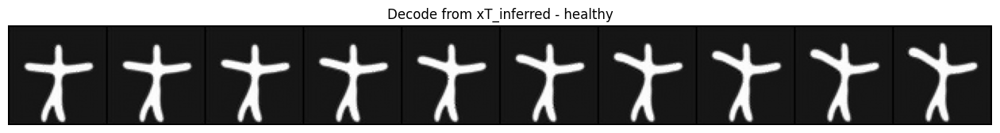

In [ ]:
# Take 1 example input
id = 0

img_ref = x_hts[id]
img_ref = rearrange(img_ref, "b h w -> b 1 h w")
img_ref = torch.tensor(img_ref, dtype=torch.float32).to(device)


# Stochastic encoder
with torch.no_grad():
    xT_inferred = gaussian_diffusion.representation_learning_diffae_encode(
        ddim_style="ddim10",
        encoder=ema_encoder,
        unet=ema_decoder,
        x_0=img_ref,
        disable_tqdm=False
    )

quick_plot_tensor(xT_inferred, title="Stochastic encode of healthy image")

# Decode from xT_inferred
# We need to sample from enough step to get good result

with torch.no_grad():
    x0_hat = gaussian_diffusion.representation_learning_diffae_sample(
        ddim_style="ddim100",
        encoder=ema_encoder,
        unet=ema_decoder,
        x_0=img_ref,
        x_T=xT_inferred,
        disable_tqdm=False
    )

quick_plot_tensor(x0_hat, title="Decode from xT_inferred - healthy")


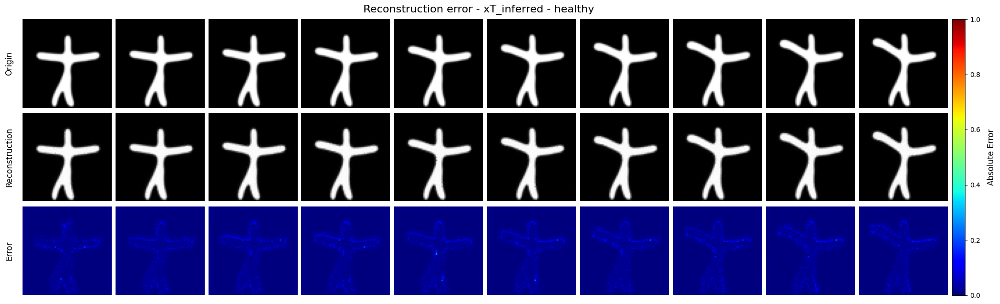

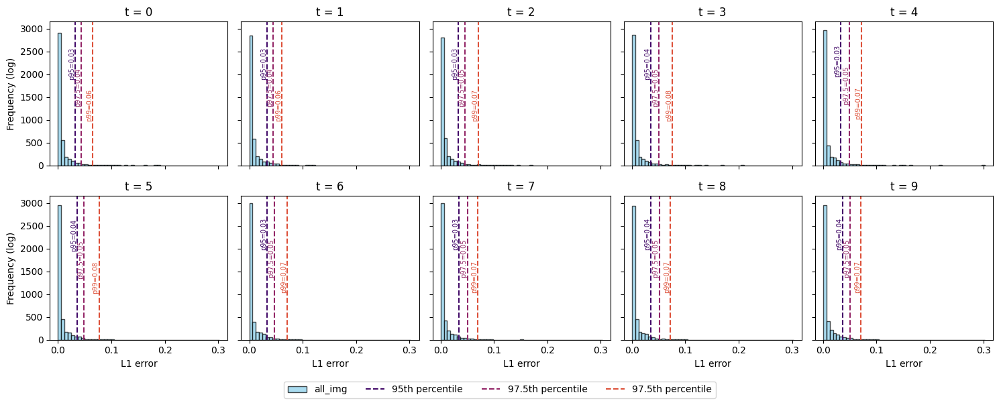

In [ ]:
# plot the difference

from src.utils.visualization import plot_comparison_starmen

opt = {}
opt["cbar_vmin"] = 0.0
opt["cbar_vmax"] = 1.0

img_diff = torch.abs(img_ref - x0_hat)
img_diff.shape
img_diff = img_diff.detach().cpu().squeeze()


imgs = [
    img_ref.detach().cpu().squeeze(), 
    x0_hat.detach().cpu().squeeze(),
    img_diff,
]

labels = [
    "Origin",
    "Reconstruction",
    "Error"
]

title = "Reconstruction error - xT_inferred - healthy"
opt["title"] = title

fig = plot_comparison_starmen(imgs, labels, is_errors=[False, False, True], opt=opt)

# plot hist of error
from src.utils.visualization import plot_error_histogram
fig = plot_error_histogram(
    diff_t=rearrange(img_diff.numpy(), "t h w -> t (h w)")
)

min noise: -0.999972403049469
max noise: 0.9930709600448608


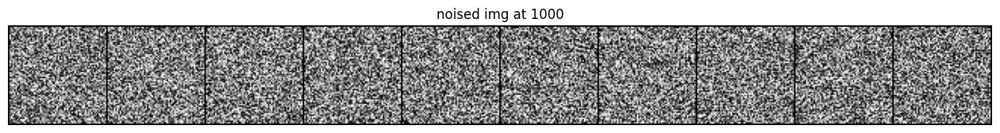

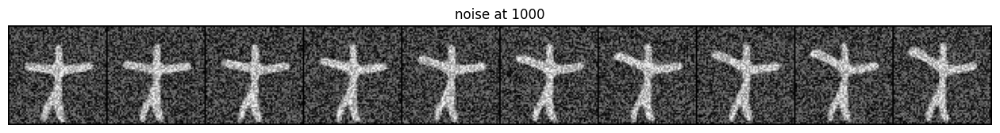

In [219]:
from src.ldae.diffusion.gaussian_diffusion import normalize_to_neg_one_to_one, unnormalize_to_zero_to_one

# img_ref = normalize_to_neg_one_to_one(img_ref)

torch.max(img_ref)
noise = torch.rand_like(img_ref)
t = 1000

# move 1 noise level
test_x_noised = gaussian_diffusion.q_sample(img_ref, t=torch.full((img_ref.shape[0], ), t-1), noise=noise)
test_x_noised

added_noise = img_ref - test_x_noised

quick_plot_tensor(test_x_noised, title=f"noised img at {t}")
quick_plot_tensor(added_noise, title=f"noise at {t}")

print(f"min noise: {torch.min(added_noise)}")
print(f"max noise: {torch.max(added_noise)}")

In [220]:
# Predict the noise using trained UNet

cond = ema_encoder(img_ref)
pred_noise = ema_decoder.forward(
    x=test_x_noised,
    time=torch.full((img_ref.shape[0], ), t-1),
    condition=cond
)

loss = (added_noise - pred_noise).abs().mean()
print(loss)

tensor(0.7276)


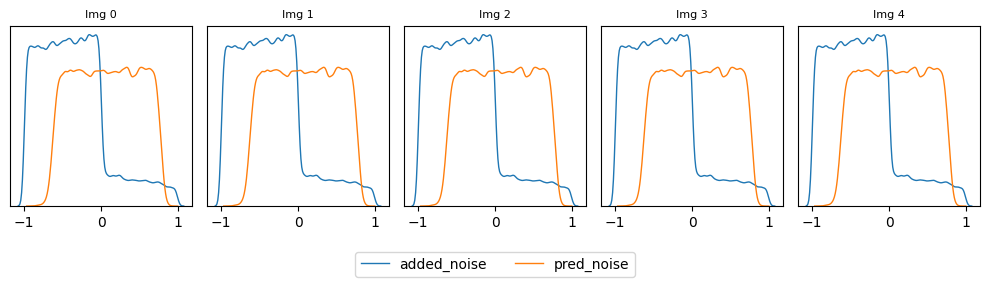

In [221]:
def plot_kde_pixel(imgs, labels, max_plot=5):
    """
    Plot histogram of pixel intensity for a list of images 
    """
    import seaborn as sns  

    for i in range(len(imgs)): 
        if isinstance(imgs[i], torch.Tensor):
            imgs[i] = imgs[i].detach().cpu().numpy()

    B = imgs[0].shape[0]
    if B > max_plot:
        B = max_plot

    fig, axes = plt.subplots(1, B, figsize=(10, 2.5))  

    for i in range(B):
        # img = imgs_a[i].squeeze()
        # img_b = imgs_b[i].squeeze()

        ax = axes[i]
        for id, img in enumerate(imgs):
            sns.kdeplot(img.squeeze().flatten(), bw_adjust=0.5, linewidth=1.0, ax=ax, label=labels[id])
        # ax.hist(pixels, bins=30, range=(0, 1), histtype='step', color='blue')

        # # KLD annotation
        # ax.text(0.01, 0.95, f"KLD= {klds[idx]:.3f}", ha='left', va='top', transform=ax.transAxes, fontsize=9)

        ax.set_title(f"Img {i}", fontsize=8)
        # ax.set_xticks([]) 
        ax.set_yticks([]) 
        # ax.spines['top'].set_visible(False)
        # ax.spines['right'].set_visible(False)
        ax.set_ylabel("")


    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, 0), ncol=len(imgs))
    plt.tight_layout()
    plt.show()

plot_kde_pixel(imgs = [added_noise, pred_noise], 
               labels=["added_noise", "pred_noise"])



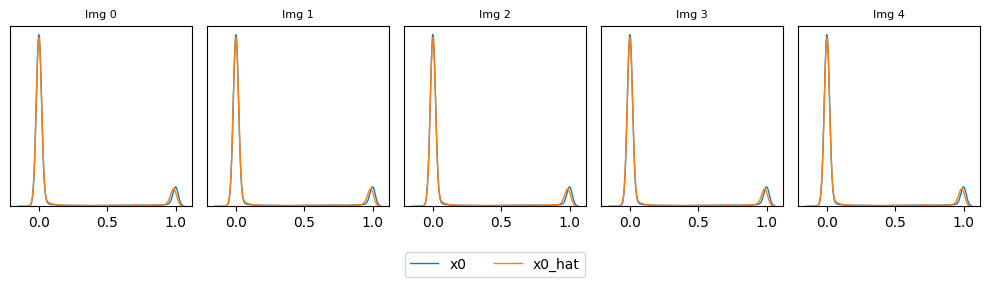

In [228]:
plot_kde_pixel(
    imgs=[img_ref, x0_hat],
    labels=["x0", "x0_hat"]
)

### Sample from anomalous images

In this experiment, we encode the image using the stochastic encoder (reverse sampling from UNet) and then decode it using diffusion UNet (DDIM sampling)

encoding loop time step: 100%|██████████| 10/10 [00:03<00:00,  2.66it/s]


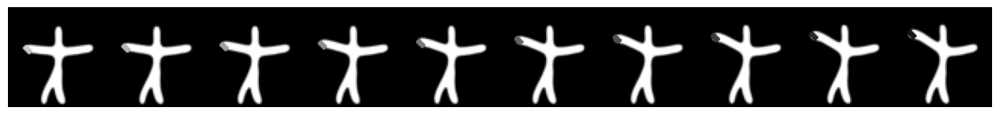

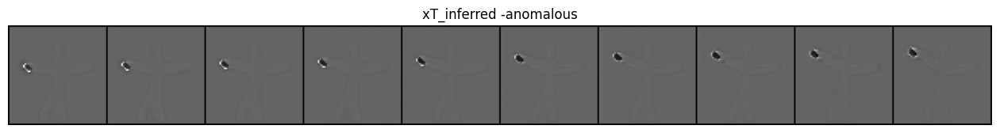

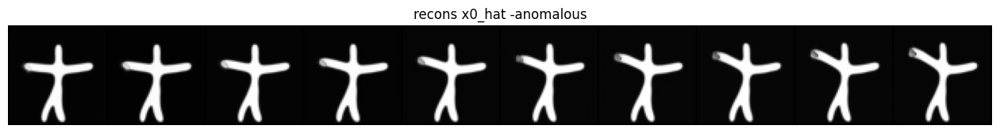

In [229]:

img_org = x_orgs[id]
img_org = rearrange(img_org, "b h w -> b 1 h w")
img_org = torch.tensor(img_org, dtype=torch.float32).to(device)

# Semantic encoder
ysem = ema_encoder(img_org)

grid = torchvision.utils.make_grid(img_org, nrow=10, normalize=True, padding=1)
plt.figure(figsize=(16, 4))  
plt.imshow(grid.permute(1, 2, 0).squeeze(), cmap='gray')
plt.axis("off")

# Stochastic encoder
test_ddim_style = "ddim10"
with torch.no_grad():
    xT_inferred = gaussian_diffusion.representation_learning_diffae_encode(
        ddim_style="ddim10",
        encoder=ema_encoder,
        unet=ema_decoder,
        x_0=img_org,
        disable_tqdm=False
    )

quick_plot_tensor(xT_inferred, "xT_inferred -anomalous")

# Decode from xT_inferred
# We need to sample from enough step to get good result

with torch.no_grad():
    x0_hat = gaussian_diffusion.representation_learning_diffae_sample(
        ddim_style="ddim100",
        encoder=ema_encoder,
        unet=ema_decoder,
        x_0=img_org,
        x_T=xT_inferred,
        disable_tqdm=True
    )

quick_plot_tensor(x0_hat, "recons x0_hat -anomalous")


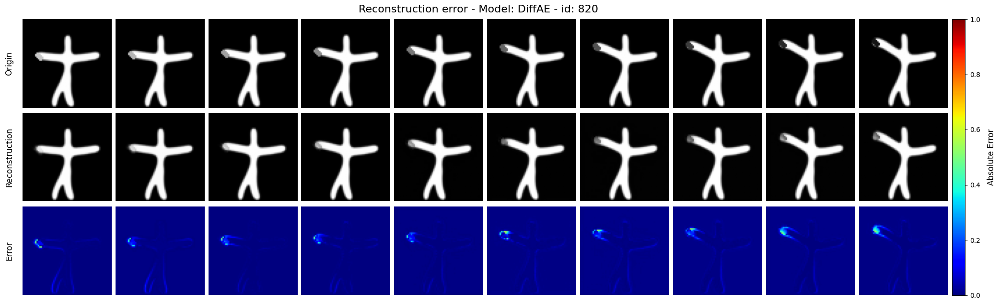

In [231]:
# Plot the reconstruction error
import torch.nn.functional as F
from src.utils.visualization import plot_comparison_starmen

opt = {}
opt["cbar_vmin"] = 0.0
opt["cbar_vmax"] = 1.0

img_diff = torch.abs(img_org - x0_hat)
img_diff.shape


imgs = [
    img_org.detach().cpu().squeeze(), 
    x0_hat.detach().cpu().squeeze(),
    img_diff.detach().cpu().squeeze(),
]

labels = [
    "Origin",
    "Reconstruction",
    "Error"
]

title = f"Reconstruction error - Model: DiffAE - id: {test_ids[id]}"
opt["title"] = title

fig = plot_comparison_starmen(imgs, labels, is_errors=[False, False, True], opt=opt)

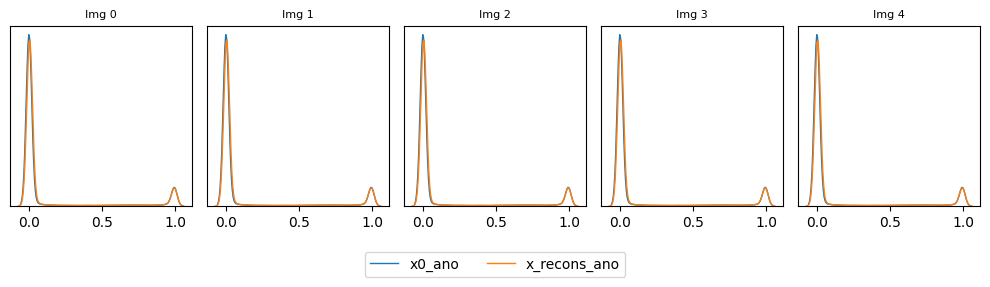

In [232]:
plot_kde_pixel(
    imgs=[img_org, x0_hat],
    labels=["x0_ano", "x_recons_ano"]
)

### Sample from xT_inferred but with healthy reference image. 

We know that semantic encoder encodes the high level structure from input. Here, we try to sample from xT_inferred of anomalous image, but using the signal from its healthy version (which we will not have in reality)

sampling loop time step: 100%|██████████| 100/100 [00:35<00:00,  2.84it/s]


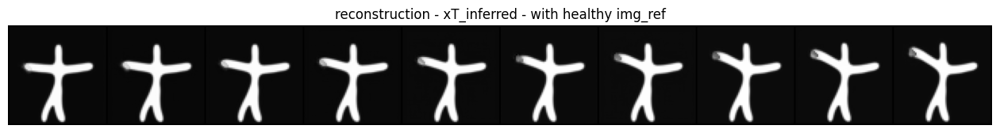

In [233]:

with torch.no_grad():
    x0_hat_ref = gaussian_diffusion.representation_learning_diffae_sample(
        ddim_style="ddim100",
        encoder=ema_encoder,
        unet=ema_decoder,
        x_0=img_ref,
        x_T=xT_inferred,
        disable_tqdm=False
    )

quick_plot_tensor(x0_hat_ref, "reconstruction - xT_inferred - with healthy img_ref")



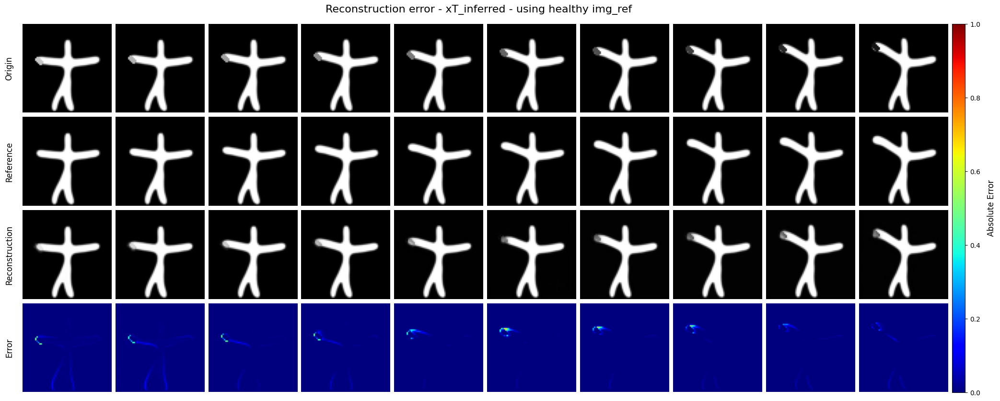

In [235]:
# Plot the comparison

img_diff = img_org - x0_hat_ref

imgs = [
    img_org.detach().cpu().squeeze(), 
    img_ref.detach().cpu().squeeze(), 
    x0_hat_ref.detach().cpu().squeeze(),
    img_diff.detach().cpu().squeeze(),
]

labels = [
    "Origin",
    "Reference",
    "Reconstruction",
    "Error"
]

title = "Reconstruction error - xT_inferred - using healthy img_ref"
opt["title"] = title

fig = plot_comparison_starmen(imgs, labels, is_errors=[False, False, False, True], opt=opt)

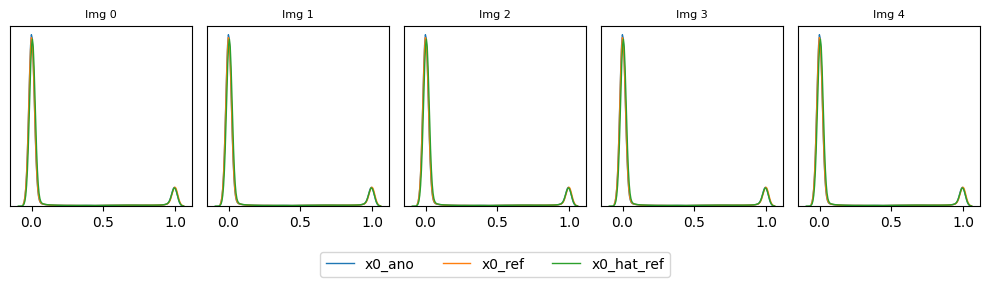

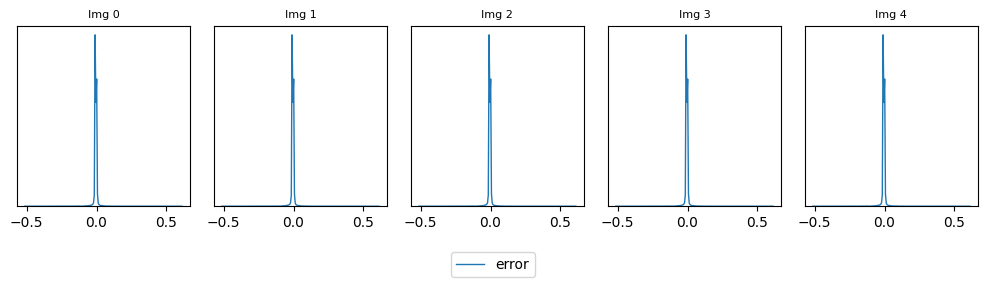

In [238]:
# Plot histogram pixel intensity

plot_kde_pixel(
    imgs = [img_org, img_ref, x0_hat_ref],
    labels=["x0_ano", "x0_ref", "x0_hat_ref"]
)

# Plot histogram of error
plot_kde_pixel(
    imgs=[img_org-x0_hat_ref],
    labels=["error"]
)

We see that the signal from healthy image is not strong enough to remove the anomaly. Because our anomaly is quite subtle, it is captured by the stochastic encoder - not the semantic encoder. Note that in this example, our anomaly is quite subtle (darker line), so most of the information is captured and encoded into the stochastic subcode xT_inferred. 


### Sample from xT of healthy image using anomalous image as ref

sampling loop time step: 100%|██████████| 100/100 [00:38<00:00,  2.60it/s]


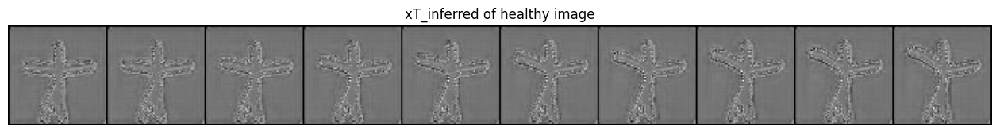

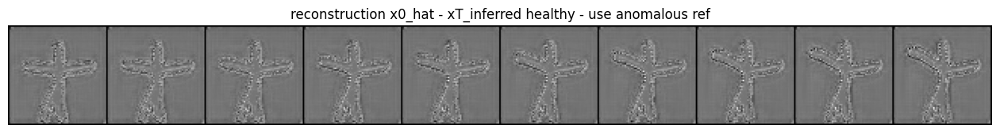

In [242]:
# Stochastic encoder of healthy image
with torch.no_grad():
    xT_inferred_ref = gaussian_diffusion.representation_learning_diffae_encode(
        ddim_style="ddim10",
        encoder=ema_encoder,
        unet=ema_decoder,
        x_0=img_ref,
        disable_tqdm=False
    )

quick_plot_tensor(xT_inferred_ref, "xT_inferred of healthy image")

# Decode using anomalous image
with torch.no_grad():
    x0_hat_ano_ref = gaussian_diffusion.representation_learning_diffae_sample(
        ddim_style="ddim100",
        encoder=ema_encoder,
        unet=ema_decoder,
        x_0=img_org,
        x_T=xT_inferred_ref,
        disable_tqdm=False
    )

quick_plot_tensor(xT_inferred_ref, "reconstruction x0_hat - xT_inferred healthy - use anomalous ref")

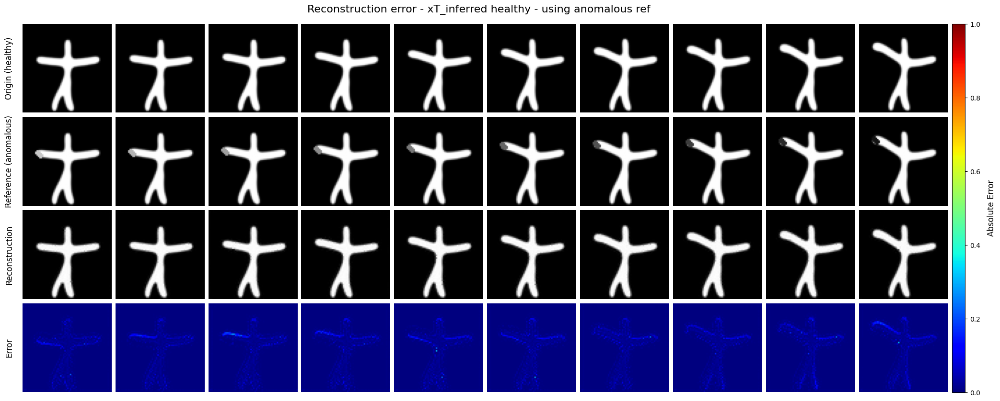

In [243]:
# Error
img_diff = img_ref - x0_hat_ano_ref

# Plot comparison
imgs = [
    img_ref.detach().cpu().squeeze(), 
    img_org.detach().cpu().squeeze(), 
    x0_hat_ano_ref.detach().cpu().squeeze(),
    img_diff.detach().cpu().squeeze(),
]

labels = [
    "Origin (healthy)",
    "Reference (anomalous)",
    "Reconstruction",
    "Error"
]

title = "Reconstruction error - xT_inferred healthy - using anomalous ref"
opt["title"] = title

fig = plot_comparison_starmen(imgs, labels, is_errors=[False, False, False, True], opt=opt)

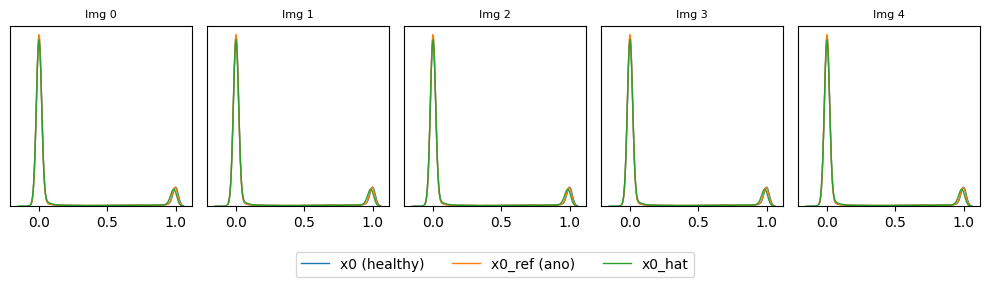

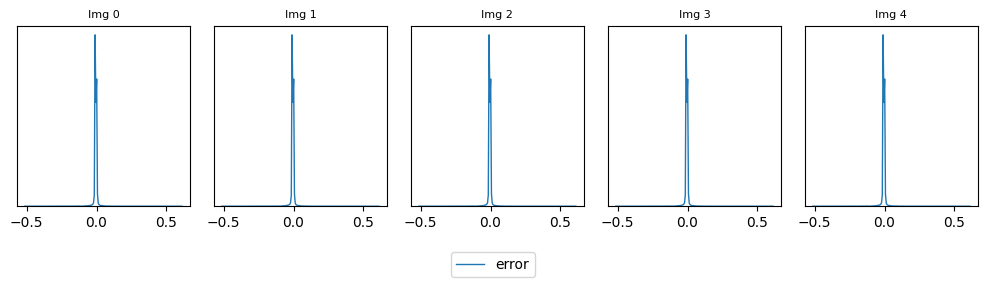

In [ ]:
# Plot histogram pixel intensity

plot_kde_pixel(
    imgs = [img_ref, img_org, x0_hat_ano_ref],
    labels=["x0 (healthy)", "x0_ref (ano)", "x0_hat"]
)

# Plot histogram of error
plot_kde_pixel(
    imgs=[img_org-x0_hat_ref],
    labels=["error"]
)

# Scenario 2: large structure anomaly

In this scenario, we use `growing_circle`, which is a large structure anomalies. We expect that this time, the semantice encoder will capture the structure of anomaly region, thus we can alter the semantic embedding to remove it in our sampling process. 

In [8]:
split = "gcircle10"

infer_dir = os.path.join(WORK_DIR, "infer", f"{split}_ddim100")


test_ds = StarmenDataset(
    data_dir=DATA_DIR,
    split=split,
    nb_subject=None,
)
test_loader = DataLoader(test_ds, batch_size=1, shuffle=True, num_workers=1)
print(f"Len of test dataset: {len(test_loader)}")

test_ids = test_ds.ids.squeeze().tolist()

# Load the original (anomalious) image from test dataset by index
x_orgs = [test_ds.get_images_by_id(id).squeeze() for id in test_ids]
x_orgs = np.stack(x_orgs).astype("float32")

# Load the groundtruth anomaly mask 
gt_paths = test_ds.datas["gt_path"].unique()
x_ano_gts = []
for id in test_ids:
    gt_path = test_ds.datas[test_ds.datas["id"] == id]["gt_path"].unique().item()
    gt = np.load(gt_path)
    x_ano_gts.append(gt)
x_ano_gts = np.stack(x_ano_gts)
x_ano_gts.shape

# Load the original healthy images
# healthy path example= data/starmen/output_random_noacc/images/SimulatedData__Reconstruction__starman__subject_s0__tp_0.npy
x_hts = []
for id in test_ids:
    for t in range(0, 10):
        ht_path = os.path.join(DATA_DIR, "images", f"SimulatedData__Reconstruction__starman__subject_s{id}__tp_{t}.npy")
        ht = np.load(ht_path)
        x_hts.append(ht)
x_hts = np.stack(x_hts)
x_hts = rearrange(x_hts, "(b t) h w -> b t h w", t=10)
x_hts.shape

Len of test dataset: 10


(10, 10, 64, 64)

### Sample from anomalous image

In [273]:
# Prepare a anomalous and a healthy data
id = 0 

# origin anomalous img
img_org = x_orgs[id]
img_org = rearrange(img_org, "b h w -> b 1 h w")
img_org = torch.tensor(img_org, dtype=torch.float32).to(device)

# origin helthy img as reference
img_ref = x_hts[id]
img_ref = rearrange(img_ref, "b h w -> b 1 h w")
img_ref = torch.tensor(img_ref, dtype=torch.float32).to(device)

sampling loop time step: 100%|██████████| 100/100 [00:33<00:00,  2.94it/s]


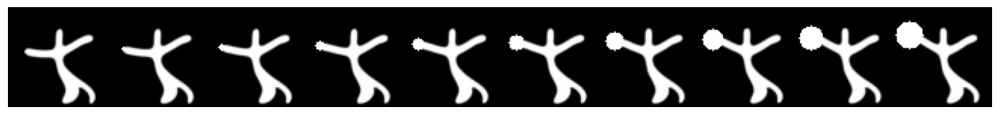

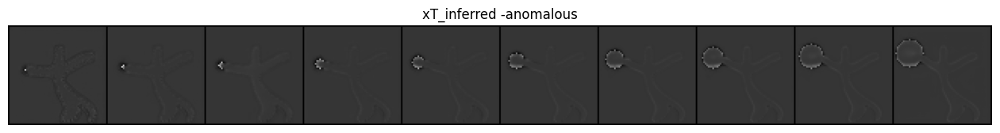

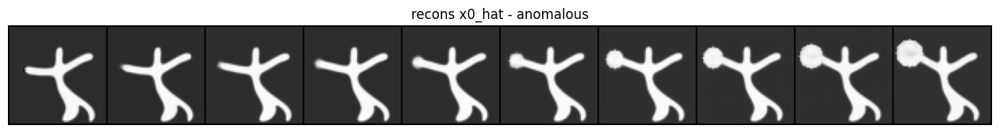

In [375]:

# Semantic encoder
ysem = ema_encoder(img_org)

grid = torchvision.utils.make_grid(img_org, nrow=10, normalize=True, padding=1)
plt.figure(figsize=(16, 4))  
plt.imshow(grid.permute(1, 2, 0).squeeze(), cmap='gray')
plt.axis("off")

# Stochastic encoder
test_ddim_style = "ddim10"
with torch.no_grad():
    xT_inferred = gaussian_diffusion.representation_learning_diffae_encode(
        ddim_style="ddim10",
        encoder=ema_encoder,
        unet=ema_decoder,
        x_0=img_org,
        disable_tqdm=False
    )

quick_plot_tensor(xT_inferred, "xT_inferred -anomalous")

# Decode from xT_inferred
# We need to sample from enough step to get good result

with torch.no_grad():
    x0_hat_ano = gaussian_diffusion.representation_learning_diffae_sample(
        ddim_style="ddim100",
        encoder=ema_encoder,
        unet=ema_decoder,
        x_0=img_org,
        x_T=xT_inferred,
        disable_tqdm=False
    )

quick_plot_tensor(x0_hat_ano, "recons x0_hat - anomalous")


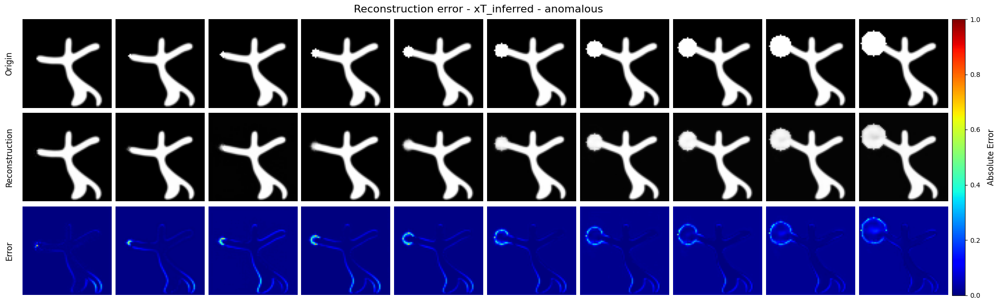

In [376]:
# Plot reconstruction error for comparison
img_diff = torch.abs(img_org - x0_hat_ano)
img_diff.shape


imgs = [
    img_org.detach().cpu().squeeze(), 
    x0_hat_ano.detach().cpu().squeeze(),
    img_diff.detach().cpu().squeeze(),
]

labels = [
    "Origin",
    "Reconstruction",
    "Error"
]

title = "Reconstruction error - xT_inferred - anomalous"
opt["title"] = title

fig = plot_comparison_starmen(imgs, labels, is_errors=[False, False, True], opt=opt)

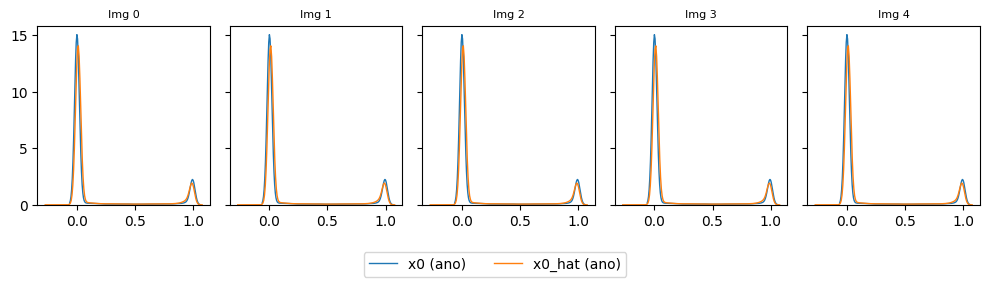

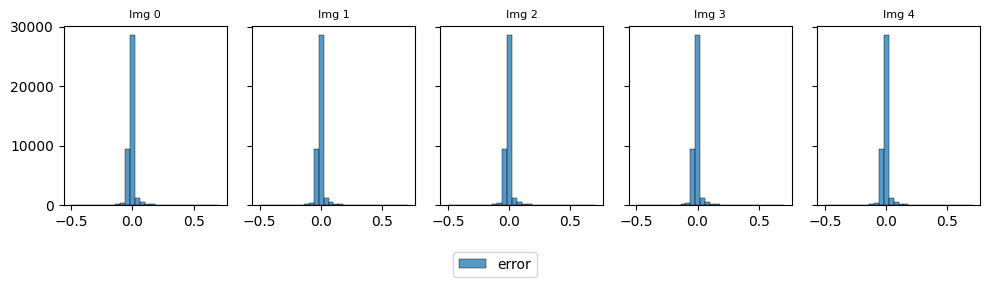

In [378]:
# plot pixel density
from src.utils.visualization import plot_kde_pixel

fig = plot_kde_pixel(
    imgs = [img_org, x0_hat],
    labels=["x0 (ano)", "x0_hat (ano)"]
)

# Plot histogram of error
fig = plot_kde_pixel(
    imgs=[img_org-x0_hat],
    labels=["error"],
    plot_type="hist"
)

### Sample from xT_inferred but using healthy image as reference


sampling loop time step: 100%|██████████| 100/100 [00:36<00:00,  2.71it/s]


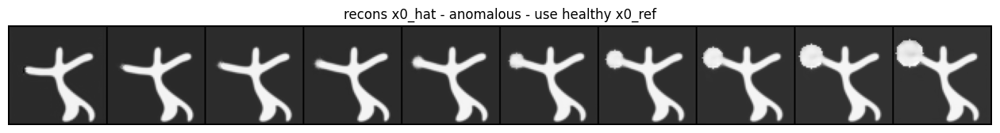

In [279]:
# Decode from xT_inferred
# using healthy img_ref as reference

with torch.no_grad():
    x0_hat_ref_ano = gaussian_diffusion.representation_learning_diffae_sample(
        ddim_style="ddim100",
        encoder=ema_encoder,
        unet=ema_decoder,
        x_0=img_ref,
        x_T=xT_inferred,
        disable_tqdm=False
    )

quick_plot_tensor(x0_hat_ref_ano, "recons x0_hat - anomalous - use healthy x0_ref")

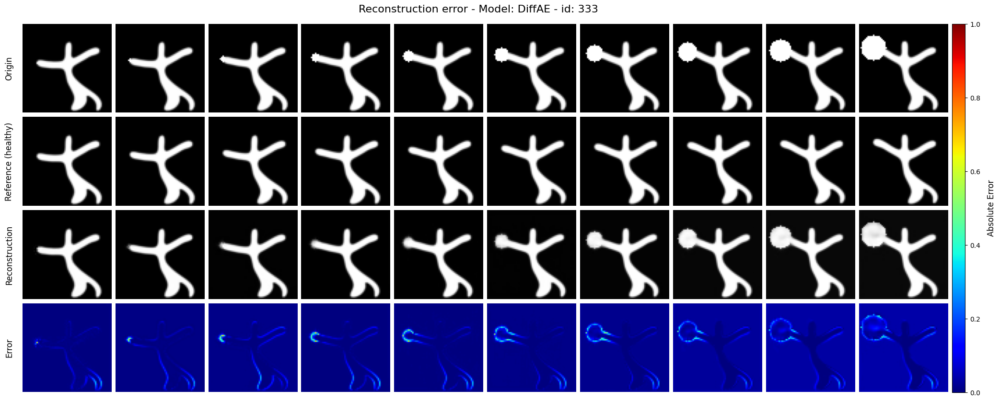

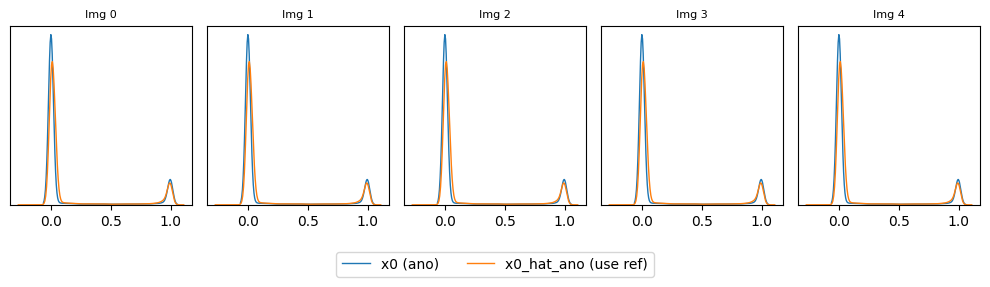

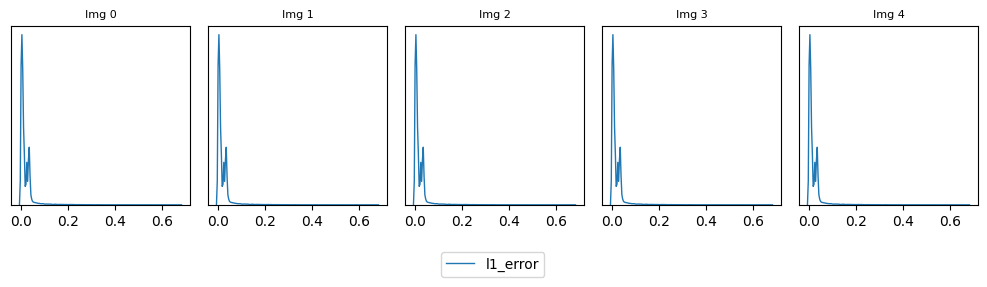

In [284]:
# Plot reconstruction error for comparison
img_diff = torch.abs(img_org - x0_hat_ref_ano)
img_diff.shape


imgs = [
    img_org.detach().cpu().squeeze(), 
    img_ref.detach().cpu().squeeze(), 
    x0_hat_ref_ano.detach().cpu().squeeze(),
    img_diff.detach().cpu().squeeze(),
]

labels = [
    "Origin",
    "Reference (healthy)",
    "Reconstruction",
    "Error"
]

title = f"Reconstruction error - Model: DiffAE - id: {test_ids[id]}"
opt["title"] = title

fig = plot_comparison_starmen(imgs, labels, is_errors=[False, False, False, True], opt=opt)

# plot pixel density

fig = plot_kde_pixel(
    imgs = [img_org, x0_hat_ref_ano],
    labels=["x0 (ano)", "x0_hat_ano (use ref)"]
)

# Plot histogram of error
fig = plot_kde_pixel(
    imgs=[img_diff],
    labels=["l1_error"]
)

### Sample from xT of healthy image using anomalous image as ref

sampling loop time step: 100%|██████████| 100/100 [00:36<00:00,  2.75it/s]


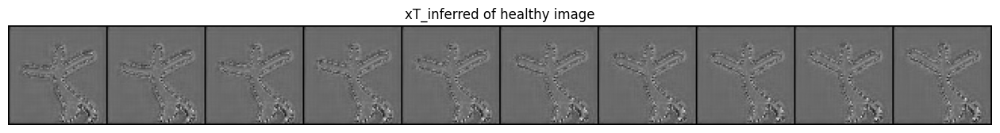

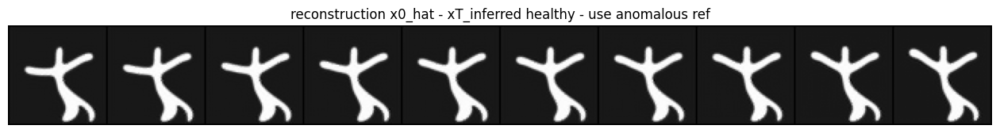

In [289]:
# Stochastic encoder of healthy image
with torch.no_grad():
    xT_inferred_ref = gaussian_diffusion.representation_learning_diffae_encode(
        ddim_style="ddim10",
        encoder=ema_encoder,
        unet=ema_decoder,
        x_0=img_ref,
        disable_tqdm=False
    )

quick_plot_tensor(xT_inferred_ref, "xT_inferred of healthy image")

# Decode using anomalous image
with torch.no_grad():
    x0_hat_ano_ref = gaussian_diffusion.representation_learning_diffae_sample(
        ddim_style="ddim100",
        encoder=ema_encoder,
        unet=ema_decoder,
        x_0=img_org,
        x_T=xT_inferred_ref,
        disable_tqdm=False
    )

quick_plot_tensor(x0_hat_ano_ref, "reconstruction x0_hat - xT_inferred healthy - use anomalous ref")

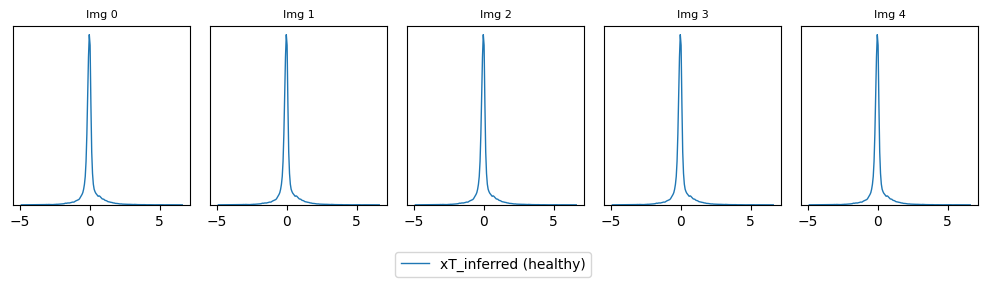

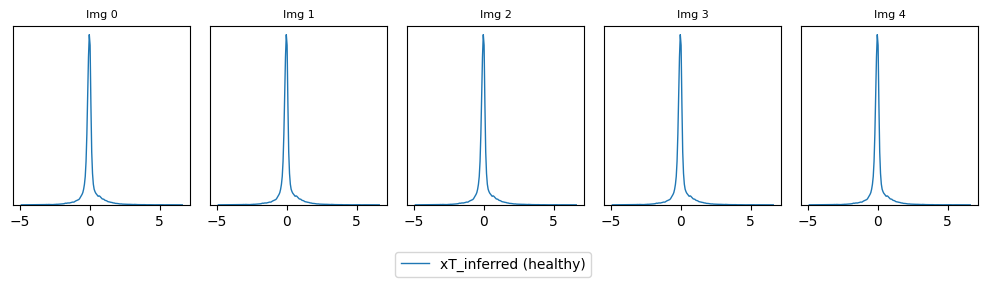

In [ ]:
# plot intensity of xT_inferred
fig = plot_kde_pixel(
    imgs=[xT_inferred_ref,],
    labels=["xT_inferred (healthy)"]
)

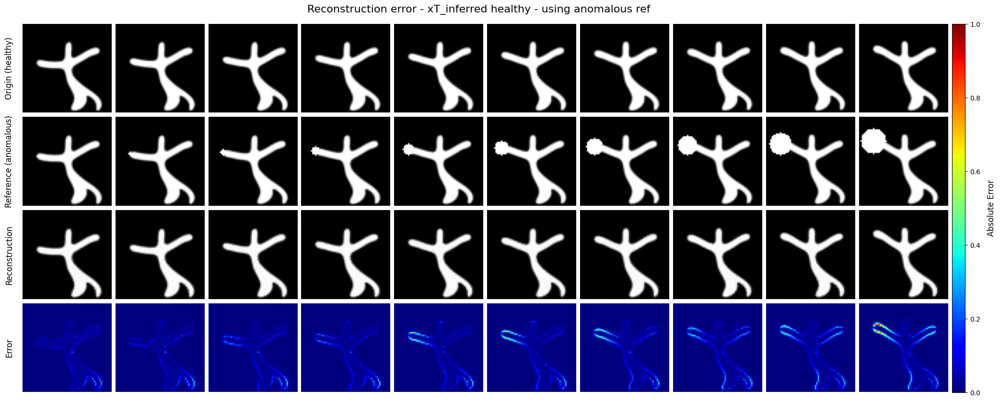

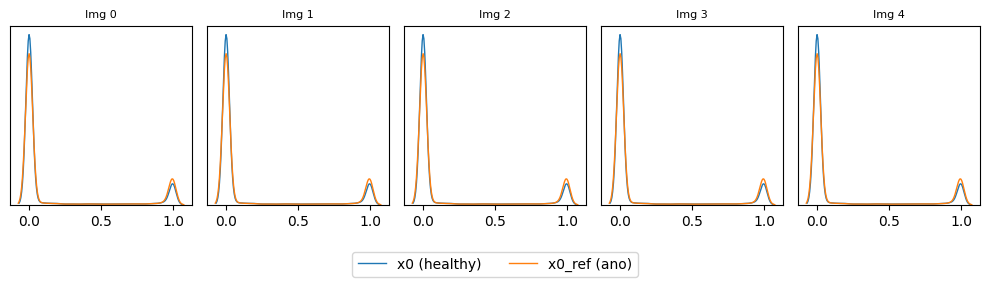

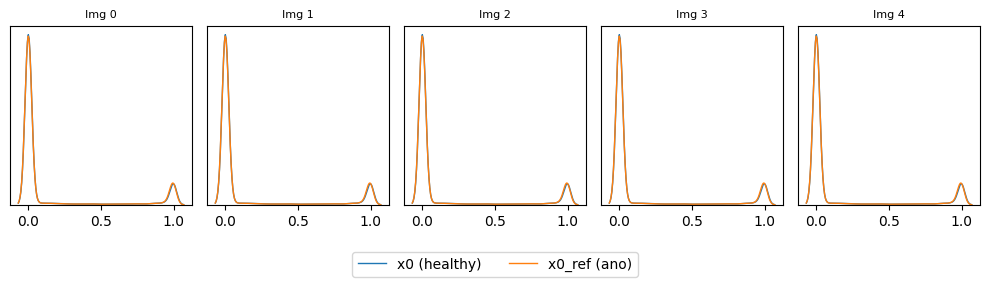

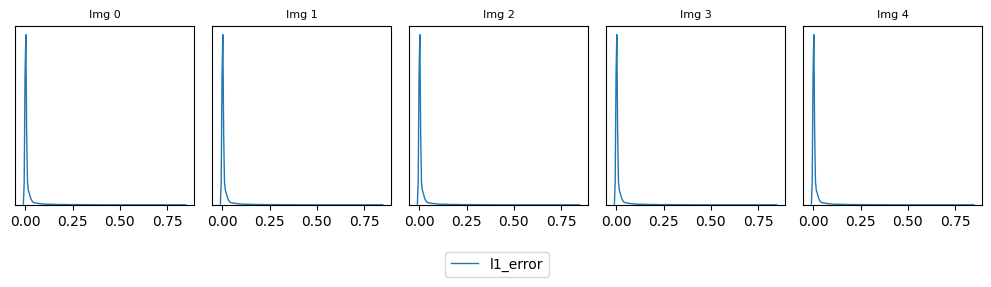

In [302]:
# Error
img_diff = torch.abs(img_ref - x0_hat_ano_ref)

# Plot comparison
imgs = [
    img_ref.detach().cpu().squeeze(), 
    img_org.detach().cpu().squeeze(), 
    x0_hat_ano_ref.detach().cpu().squeeze(),
    img_diff.detach().cpu().squeeze(),
]

labels = [
    "Origin (healthy)",
    "Reference (anomalous)",
    "Reconstruction",
    "Error"
]

title = "Reconstruction error - xT_inferred healthy - using anomalous ref"
opt["title"] = title

fig = plot_comparison_starmen(imgs, labels, is_errors=[False, False, False, True], opt=opt)

# Plot histogram pixel intensity

fig = plot_kde_pixel(
    imgs = [img_ref[5:], 
            img_org[5:], 
            ],
    labels=["x0 (healthy)", "x0_ref (ano)", "x0_hat_ano_ref"],
)


fig = plot_kde_pixel(
    imgs = [img_ref[:5], 
            img_org[:5], 
            ],
    labels=["x0 (healthy)", "x0_ref (ano)", "x0_hat_ano_ref"],
)

# Plot histogram of error
fig = plot_kde_pixel(
    imgs=[img_diff[5:]],
    labels=["l1_error"]
)

### Sample from N(0, I) - healthy

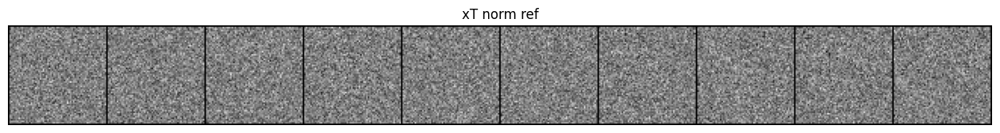

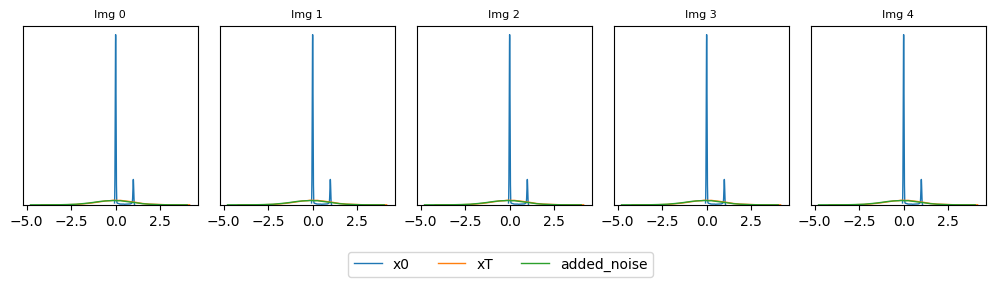

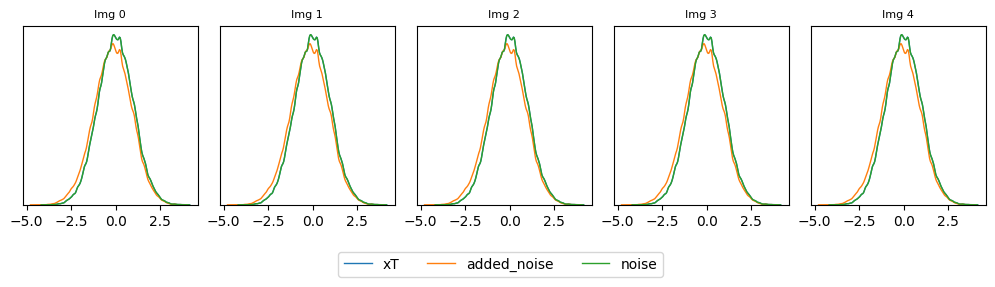

In [350]:
# Decode using fron Normal(0, I) with semantic encoder

noise = torch.randn_like(img_org)
t = 1000
t = torch.full((img_org.shape[0],), t-1)
xT_norm = gaussian_diffusion.q_sample(img_org, t=t, noise=noise)
added_noise = xT_norm - img_org

fig = quick_plot_tensor(xT_norm, "xT norm ref")

fig = plot_kde_pixel(
    imgs=[img_org, xT_norm, added_noise],
    labels=["x0", "xT", "added_noise"]
)

fig = plot_kde_pixel(imgs=[xT_norm, added_noise, noise], labels=["xT", "added_noise", "noise"])

sampling loop time step: 100%|██████████| 100/100 [00:28<00:00,  3.52it/s]


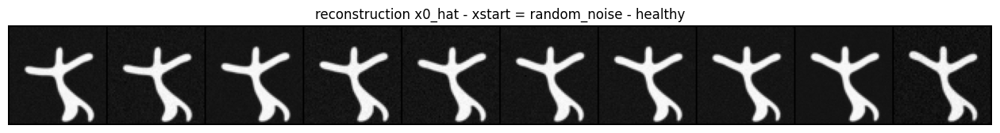

In [ ]:
# Sample from random noise

with torch.no_grad():
    x0_hat_semantic = gaussian_diffusion.representation_learning_diffae_sample(
        ddim_style="ddim100",
        encoder=ema_encoder,
        unet=ema_decoder,
        x_0=img_ref,
        x_T=torch.randn_like(img_ref),
        disable_tqdm=False
    )

quick_plot_tensor(x0_hat_semantic, "reconstruction x0_hat - xstart = random_noise - healthy")

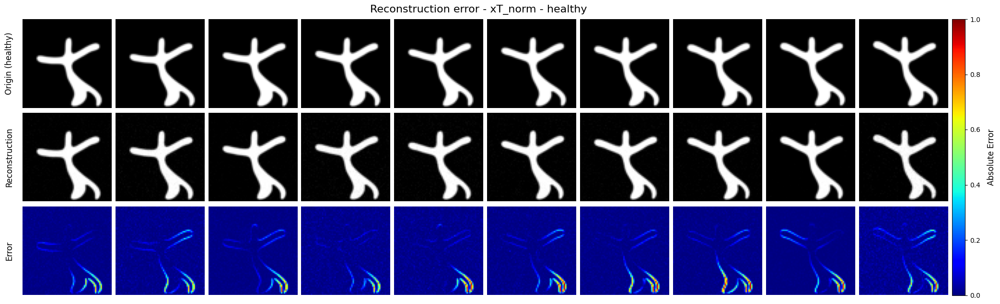

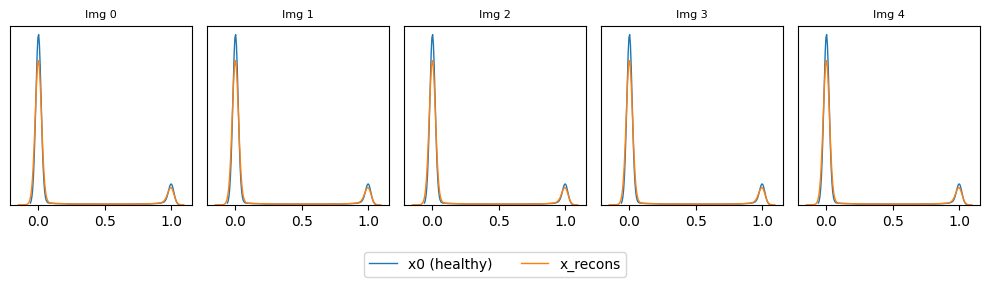

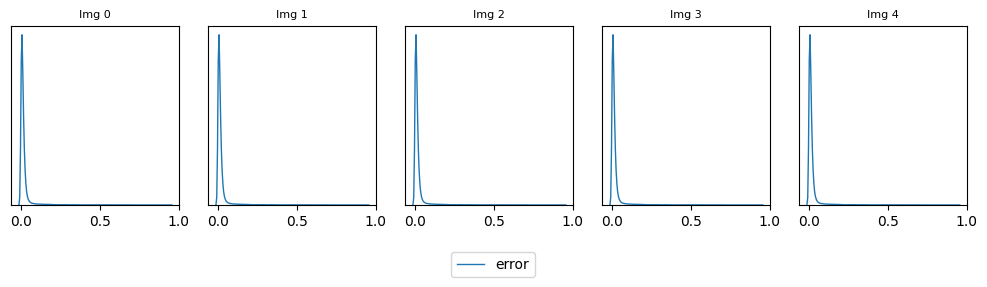

In [353]:
# Error
img_diff = torch.abs(img_ref - x0_hat_semantic)

# Plot comparison
imgs = [
    img_ref.detach().cpu().squeeze(), 
    x0_hat_semantic.detach().cpu().squeeze(), 
    img_diff.detach().cpu().squeeze(),
]

labels = [
    "Origin (healthy)",
    "Reconstruction",
    "Error"
]

title = "Reconstruction error - xT_norm - healthy"
opt["title"] = title

fig = plot_comparison_starmen(imgs, labels, is_errors=[False, False, True], opt=opt)

# Plot histogram pixel intensity

fig = plot_kde_pixel(
    imgs = [img_ref[:], 
            x0_hat_semantic[:],],
    labels=["x0 (healthy)", "x_recons", "error"],
)

fig = plot_kde_pixel(
    imgs = [img_diff],
    labels=["error"],
)

### Sample from N(0, I) - anomalous


sampling loop time step: 100%|██████████| 100/100 [00:36<00:00,  2.71it/s]


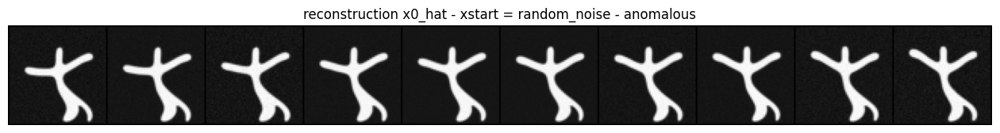

In [351]:
# Sample from random noise

with torch.no_grad():
    x0_hat_semantic_ano = gaussian_diffusion.representation_learning_diffae_sample(
        ddim_style="ddim100",
        encoder=ema_encoder,
        unet=ema_decoder,
        x_0=img_org,
        x_T=torch.randn_like(img_org),
        disable_tqdm=False
    )

quick_plot_tensor(x0_hat_semantic_ano, "reconstruction x0_hat - xstart = random_noise - anomalous")

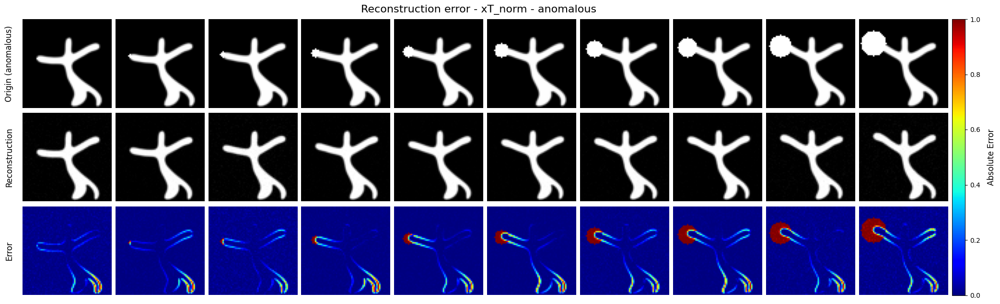

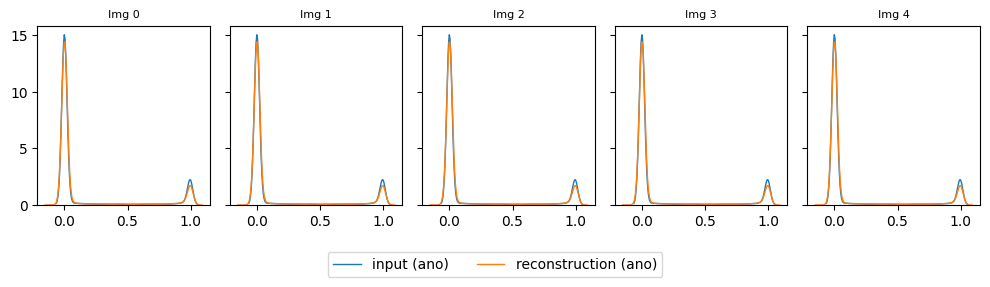

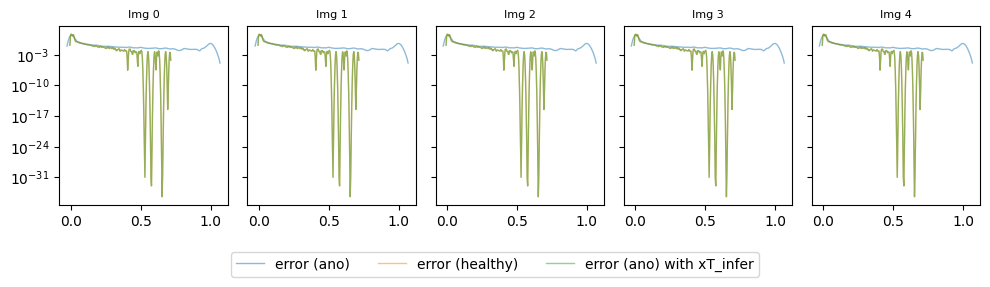

In [383]:
# Error
img_diff_ano = torch.abs(img_org - x0_hat_semantic_ano)

# Plot comparison
imgs = [
    img_org.detach().cpu().squeeze(), 
    x0_hat_semantic_ano.detach().cpu().squeeze(), 
    img_diff_ano.detach().cpu().squeeze(),
]

labels = [
    "Origin (anomalous)",
    "Reconstruction",
    "Error"
]

title = "Reconstruction error - xT_norm - anomalous"
opt["title"] = title

fig = plot_comparison_starmen(imgs, labels, is_errors=[False, False, True], opt=opt)

# Plot histogram pixel intensity

fig = plot_kde_pixel(
    imgs = [img_org[:], 
            x0_hat_semantic_ano[:],],
    labels=["input (ano)", "reconstruction (ano)", "error"],
)


# Compare errors 

img_diff_xT_infer = torch.abs(img_org - x0_hat_ano)

fig = plot_kde_pixel(
    imgs = [img_diff_ano, img_diff, img_diff_xT_infer],
    labels=["error (ano)", "error (healthy)", "error (ano) with xT_infer"],
    plot_type="kde",
    alpha=0.5,
    log_scale=[False, True]
)

# Analyze the stochastic subcode space

Here, we repeat the step of choosing a sample for analysis

In [197]:
# Prepare a anomalous and a healthy data
id = 0

# origin anomalous img
img_org = x_orgs[id]
img_org = rearrange(img_org, "b h w -> b 1 h w")
img_org = torch.tensor(img_org, dtype=torch.float32).to(device)

# origin helthy img as reference
img_ref = x_hts[id]
img_ref = rearrange(img_ref, "b h w -> b 1 h w")
img_ref = torch.tensor(img_ref, dtype=torch.float32).to(device)

# ground truth anomaly mask
img_ano_gt = x_ano_gts[id]
img_ano_gt = rearrange(img_ano_gt, "b h w -> b 1 h w")
img_ano_gt = torch.tensor(img_ano_gt, dtype=torch.float32).to(device)

encoding loop time step: 100%|██████████| 100/100 [00:37<00:00,  2.69it/s]


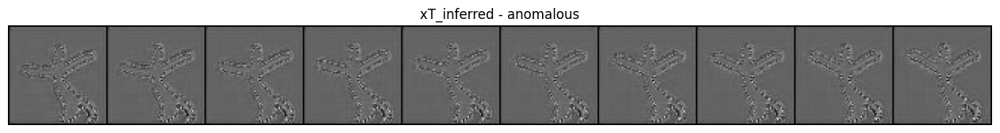

In [55]:
# Choose healthy image
x0 = img_ref

# Semantic encoder
ysem = ema_encoder(x0)

# Stochastic encoder
# For better quality, we perform the reversal with more steps
with torch.no_grad():
    xT_inferred = gaussian_diffusion.representation_learning_diffae_encode(
        ddim_style="ddim100",
        encoder=ema_encoder,
        unet=ema_decoder,
        x_0=x0,
        disable_tqdm=False
    )


quick_plot_tensor(xT_inferred, "xT_inferred - anomalous")

We see that the `xT_inferred` in stochastic subcode seems to not follow a Gaussian distribution, which indicates there's a problem with our reverse DDIM sample. Here we compare the pixel intensity with a normal distribution accquired from normal forward pass

$$
x_T^{\text{norm}} = \sqrt{\bar\alpha_T} x_0 + \sqrt{1 - \bar{\alpha_T}} \epsilon
$$

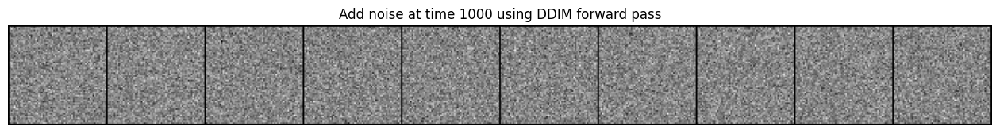

In [59]:
# Normally add noise to image

noise = torch.randn_like(x0)
t = 1000
t = torch.full((x0.shape[0],), t-1)
xT_norm = gaussian_diffusion.q_sample(x0, t=t, noise=noise)

quick_plot_tensor(xT_norm, f"Add noise at time {t[0].item()+1} using DDIM forward pass")

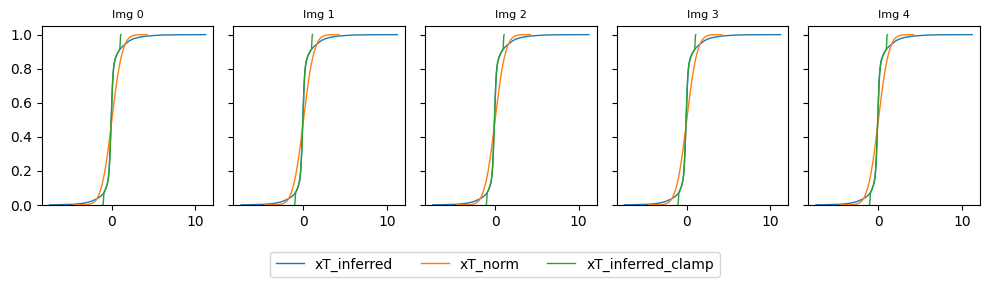

In [60]:
# Compare intensity of xT_norm and xT_inferred

xT_inferred_clamp = torch.clamp(xT_inferred, -1, 1)


fig = plot_kde_pixel(
    imgs=[xT_inferred, xT_norm, xT_inferred_clamp],
    labels=["xT_inferred", "xT_norm", "xT_inferred_clamp"],
    cumulative=True
)

There are some large value outliers in `xT_inferred`. We need to investigate why the prediction from our model is wrong. 

## Model pred for 1 pass

tensor(0.0003)


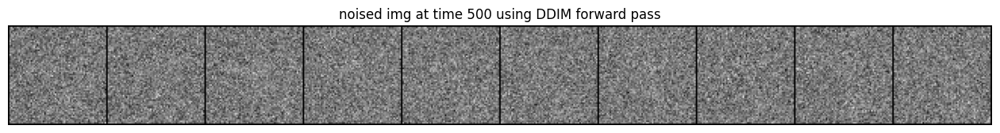

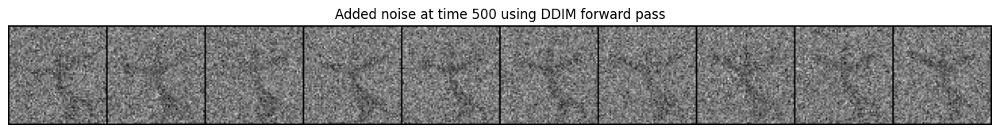

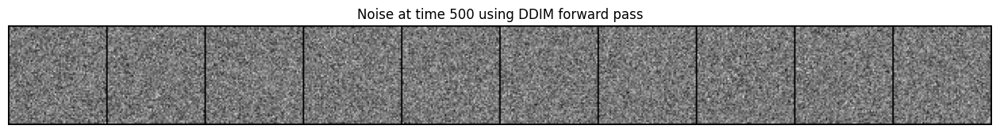

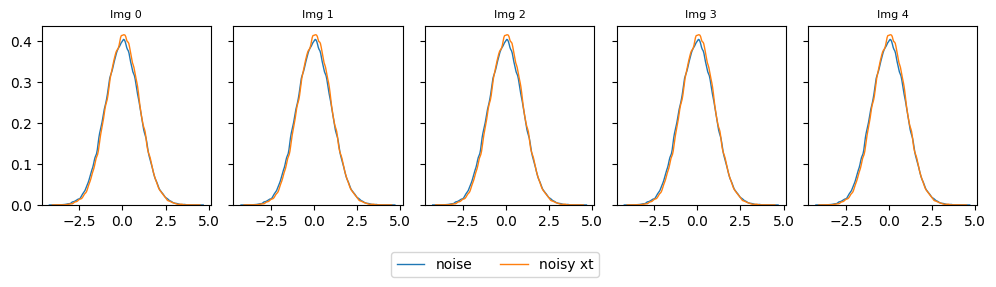

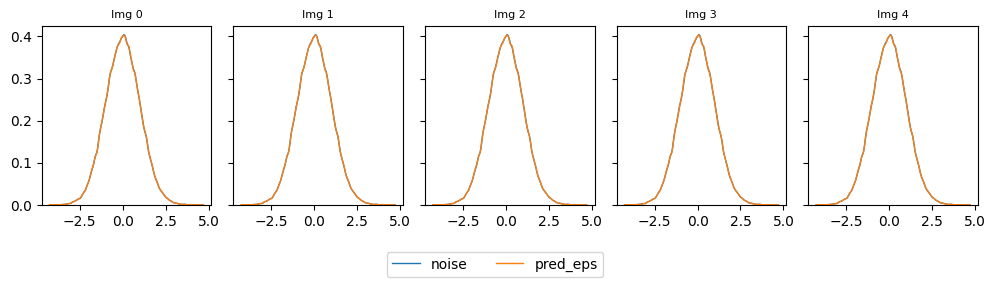

In [71]:
# Add 1 step of noise to img

noise = torch.randn_like(x0)
t = 500
t = torch.full((x0.shape[0],), t-1)
t_xt = gaussian_diffusion.q_sample(x0, t=t, noise=noise)
t_added_noise = t_xt - x0

quick_plot_tensor(t_xt, f"noised img at time {t[0].item()+1} using DDIM forward pass")
quick_plot_tensor(t_added_noise, f"Added noise at time {t[0].item()+1} using DDIM forward pass")
quick_plot_tensor(noise, f"Noise at time {t[0].item()+1} using DDIM forward pass")

fig = plot_kde_pixel(
    [noise, t_xt], 
    ["noise", "noisy xt"])

# Model prediction (pred epsilon)
t_pred_eps = ema_decoder.forward(t_xt, t-1, condition=ysem)

fig = plot_kde_pixel(
    [noise, t_pred_eps], 
    ["noise", "pred_eps"])

# calculate loss
loss = gaussian_diffusion.p_loss(noise, t_pred_eps)
print(loss)

From the $\epsilon_{\theta}$, we can calculate the $\hat{x_0} = f_{\theta} (x_t, t, y_{\text{sem}})$ - the prediction of original image

tensor(0.0208)


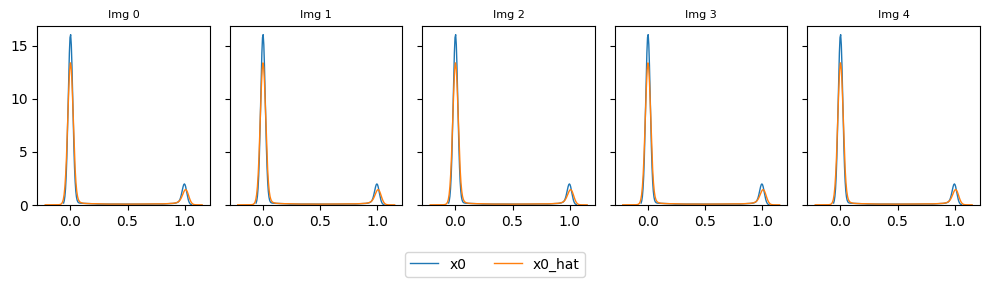

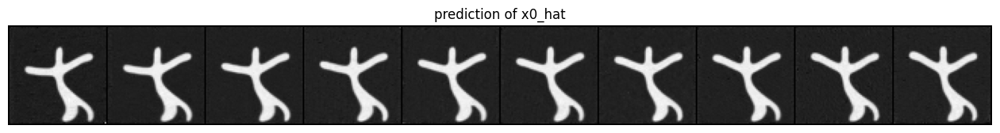

In [75]:
# Pred x0_hat from pred_eps
x0_hat = gaussian_diffusion.predicted_noise_to_predicted_x_0(t_xt, t, t_pred_eps)

fig = plot_kde_pixel(
    [x0, x0_hat], 
    ["x0", "x0_hat"])

quick_plot_tensor(x0_hat, "prediction of x0_hat")

x0_loss = gaussian_diffusion.p_loss(x0, x0_hat, loss_type="l1")
print(x0_loss)

## Encode with DDIM reverse

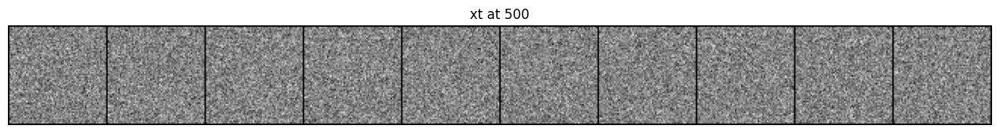

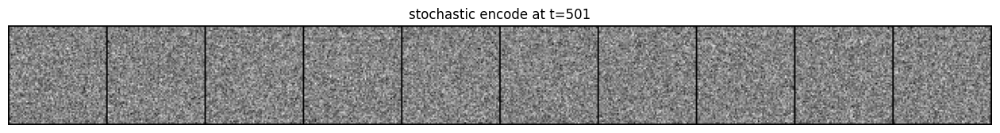

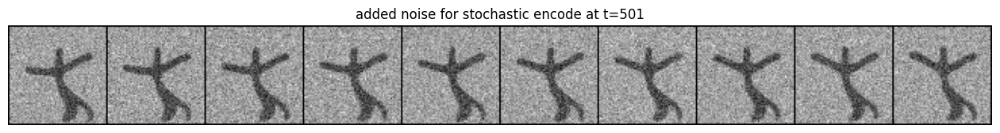

In [163]:
#Encode 1 step with DDIM reverse process
from src.ldae.diffusion.ddim import DDIM


ddim_style = "ddim1000"
new_betas, timestep_map = gaussian_diffusion.get_ddim_betas_and_timestep_map(ddim_style, gaussian_diffusion.alphas_cumprod.cpu().numpy())
ddim = DDIM(new_betas, timestep_map, gaussian_diffusion.device)

# print(ddim.timesteps)
# print(ddim.timestep_map)
# ddim.alphas_cumprod_prev == gaussian_diffusion.alphas_cumprod_prev


# Encode xt (500) to xt (501)

quick_plot_tensor(t_xt, "xt at 500")

t_enc = 501
t_enc = torch.full((x0.shape[0],), t_enc)

t_xt_infer = ddim.ddim_encode(
    denoise_fn=ema_decoder,
    x_t=t_xt,
    t=t_enc,
    condition=ysem
)

quick_plot_tensor(t_xt_infer, f"stochastic encode at t={t_enc[0].item()}")
quick_plot_tensor(t_xt_infer - t_xt, f"added noise for stochastic encode at t={t_enc[0].item()}")


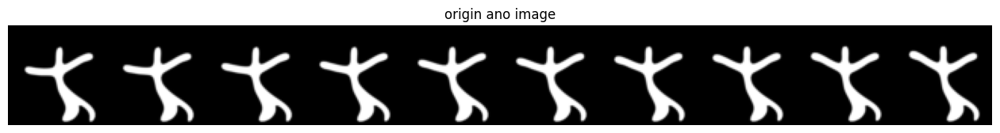

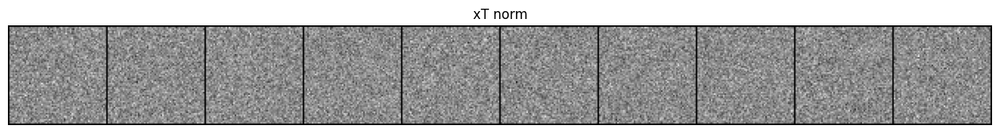

In [331]:
# Choose image

x0 = img_ref  # healthy image
x0_ano = img_org # anomaly_image
quick_plot_tensor(x0, "origin ano image")

# Normal add noise
noise = torch.randn_like(x0)
noise_t = 1000
t = torch.full((x0.shape[0],), noise_t-1)
t_xt = gaussian_diffusion.q_sample(x0, t=t, noise=noise)

quick_plot_tensor(t_xt, "xT norm")


In [223]:
# Stochastic encoder
with torch.no_grad():
    xT_infer_ht = gaussian_diffusion.representation_learning_diffae_encode(
        ddim_style="ddim10",
        encoder=ema_encoder,
        unet=ema_decoder,
        x_0=x0,
        disable_tqdm=False
    )

# Stochastic encoder ano image
with torch.no_grad():
    xT_infer_ano = gaussian_diffusion.representation_learning_diffae_encode(
        ddim_style="ddim10",
        encoder=ema_encoder,
        unet=ema_decoder,
        x_0=x0_ano,
        disable_tqdm=False
    )

encoding loop time step: 100%|██████████| 10/10 [00:03<00:00,  2.65it/s]


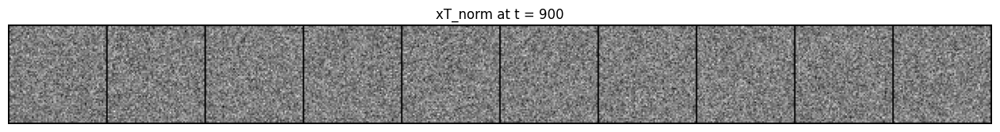

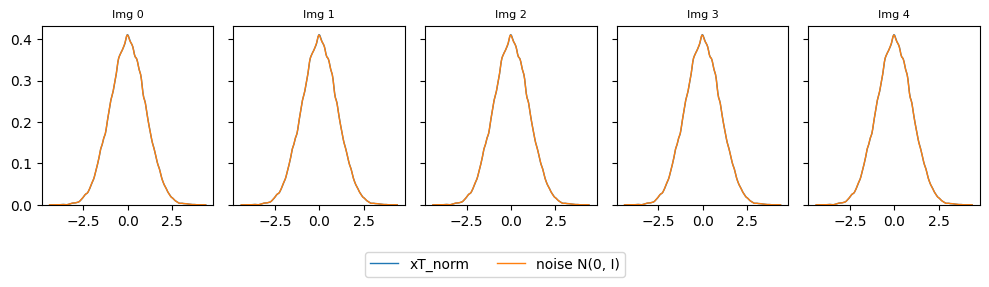

In [219]:
quick_plot_tensor(t_xt, f"xT_norm at t = {noise_t}")
fig = plot_kde_pixel(
    [t_xt, noise], 
    ["xT_norm", "noise N(0, I)"])

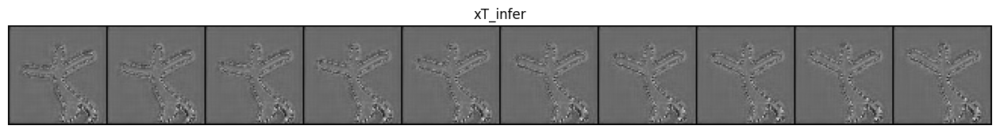

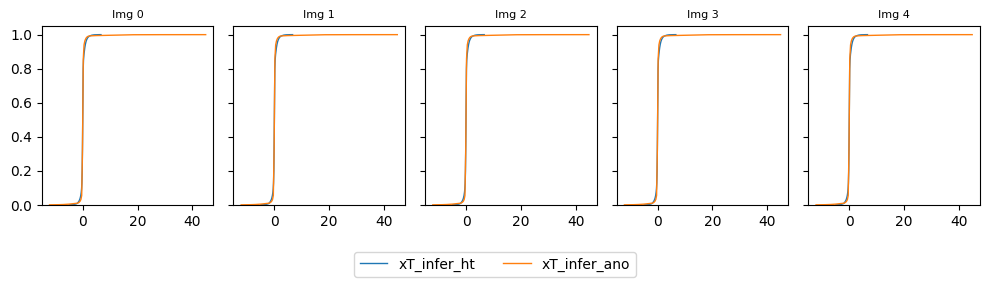

In [228]:
quick_plot_tensor(xT_infer_ht, "xT_infer")
fig = plot_kde_pixel(
    [xT_infer_ht, xT_infer_ano], 
    ["xT_infer_ht", "xT_infer_ano"],
    cumulative=True)

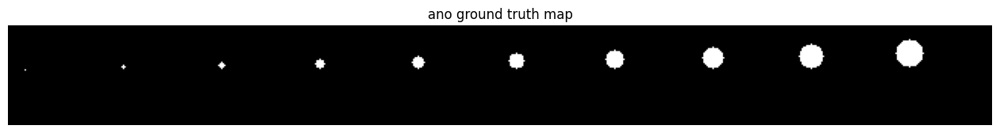

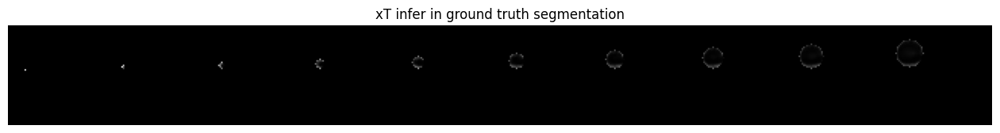

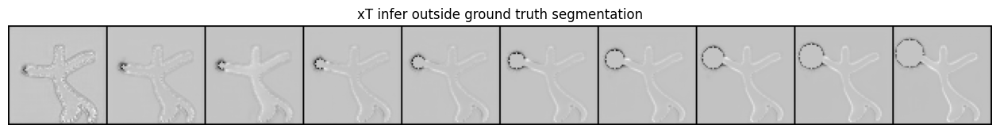

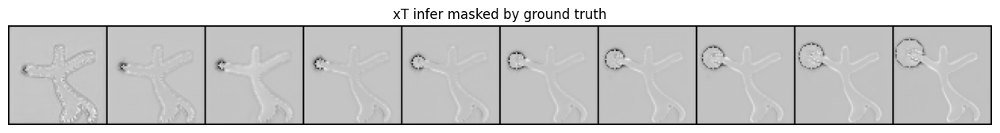

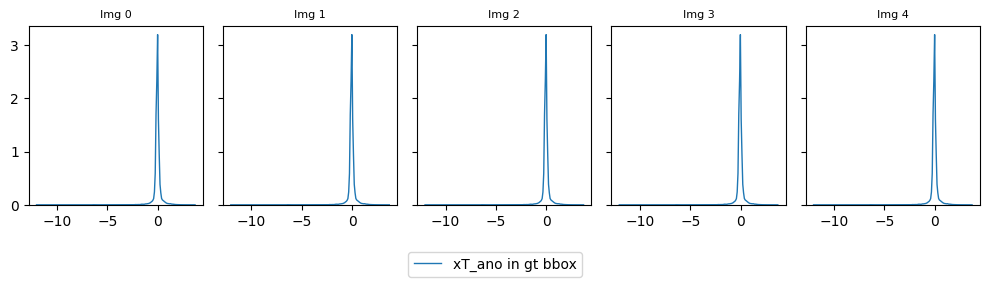

In [271]:
# Mask using the ground truth anomaly map
quick_plot_tensor(img_ano_gt, "ano ground truth map")

xT_infer_ano_bbox = torch.where(img_ano_gt == 0, 0, xT_infer_ano)
quick_plot_tensor(xT_infer_ano_bbox, "xT infer in ground truth segmentation")

xT_infer_ano_out = torch.where(img_ano_gt == 0, xT_infer_ano, 0)
quick_plot_tensor(xT_infer_ano_out, "xT infer outside ground truth segmentation")

xT_infer_ano_mask = torch.where(img_ano_gt == 0, xT_infer_ano, xT_infer_ht)
quick_plot_tensor(xT_infer_ano_mask, "xT infer masked by ground truth")

fig = plot_kde_pixel(
    [xT_infer_ano_out], 
    ["xT_ano in gt bbox"],)

sampling loop time step: 100%|██████████| 100/100 [00:39<00:00,  2.50it/s]


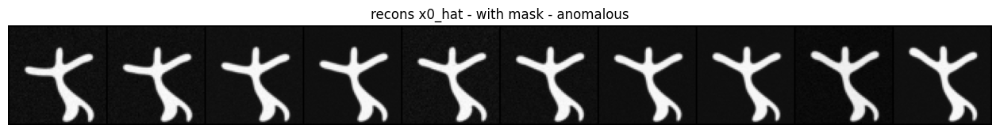

In [332]:
# Decode from xT_mask using an img as reference

with torch.no_grad():
    x_recon_mask = gaussian_diffusion.representation_learning_diffae_sample(
        ddim_style="ddim100",
        encoder=ema_encoder,
        unet=ema_decoder,
        x_0=x0_ano,
        x_T=t_xt,
        disable_tqdm=False
    )

quick_plot_tensor(x_recon_mask, "recons x0_hat - with mask - anomalous")

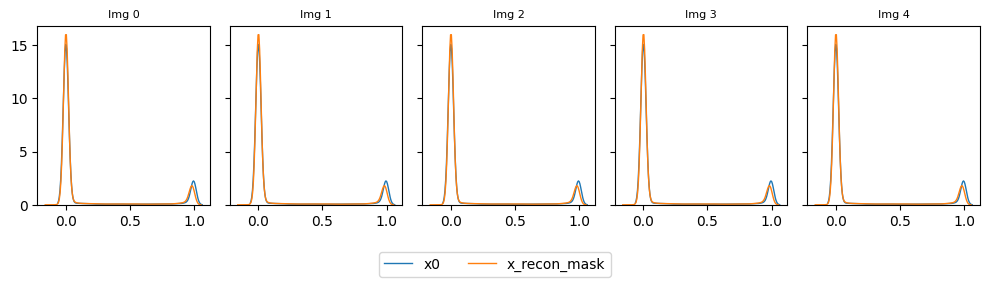

In [277]:
fig = plot_kde_pixel(
    [x0_ano, x_recon_mask], 
    ["x0", "x_recon_mask"],)

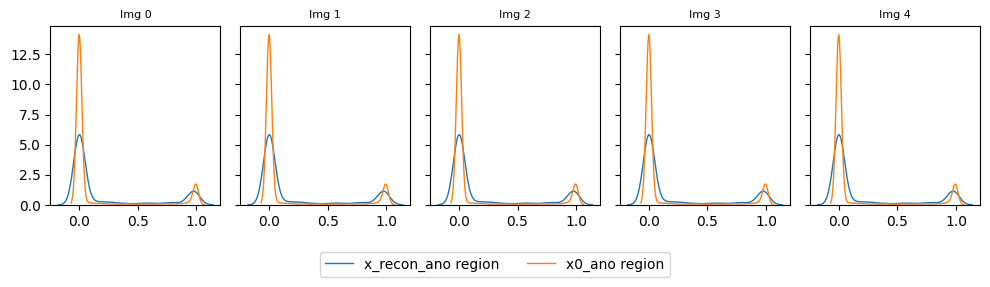

In [317]:
x_recon_mask_in = torch.where(img_ano_gt != 0, x_recon_mask, torch.full_like(x0_ano, float("nan")))
x0_ano_in = torch.where(img_ano_gt != 0, torch.full_like(x0_ano, float("nan")), x0_ano)

fig = plot_kde_pixel(
    [x_recon_mask_in[5:], x0_ano_in[5:]], 
    ["x_recon_ano region", "x0_ano region"],
    plot_type="kde")

## Postprocessing

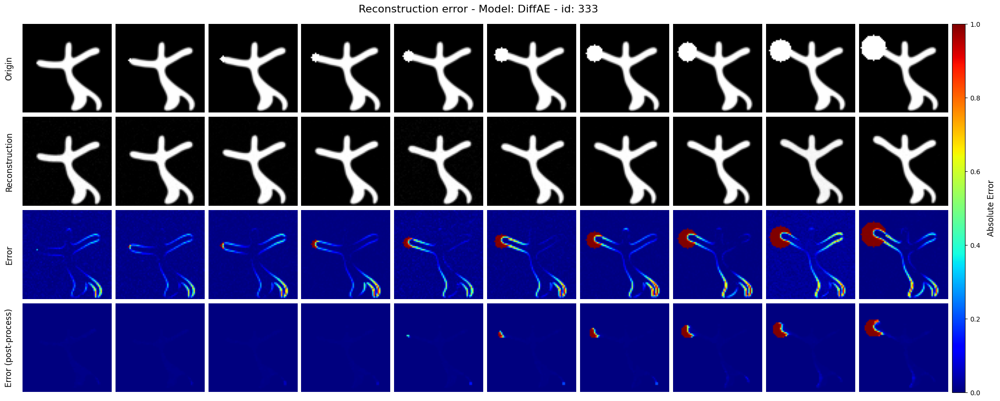

In [478]:
x_diff = (x0_ano - x_recon_mask).abs()

# Filter out background based on pixel intensity
# choose a threshold 0.01 (pure background)
mask = x0_ano.sum(dim=1, keepdim=True) > 0.01
# Erode the mask a bit to remove some of the reconstruction errors at the edges.
mask = (F.avg_pool2d(mask.float(), kernel_size=5, stride=1, padding=2) > 0.9)

# Apply median filder 
from src.utils.metrics import apply_2d_median_filter, apply_3d_median_filter
x_diff_post = (mask * x_diff)
x_diff_post = apply_3d_median_filter(x_diff_post.squeeze(), 3)

# Plot comparison
opt = dict()
opt["cbar_vmin"] = 0.0
opt["cbar_vmax"] = 1.0

imgs = [
    x0_ano.detach().cpu().squeeze(), 
    x_recon_mask.detach().cpu().squeeze(),
    x_diff.detach().cpu().squeeze(),
    x_diff_post
]

labels = [
    "Origin",
    "Reconstruction",
    "Error",
    "Error (post-process)"
]

title = f"Reconstruction error - Model: DiffAE - id: {test_ids[id]}"
opt["title"] = title

fig = plot_comparison_starmen(imgs, labels, is_errors=[False, False, True, True], opt=opt)


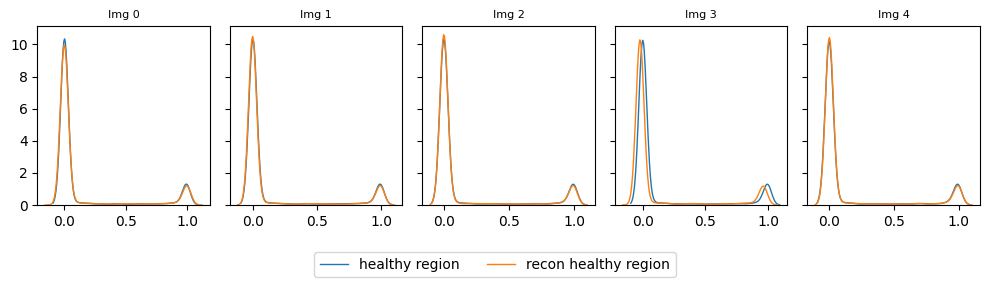

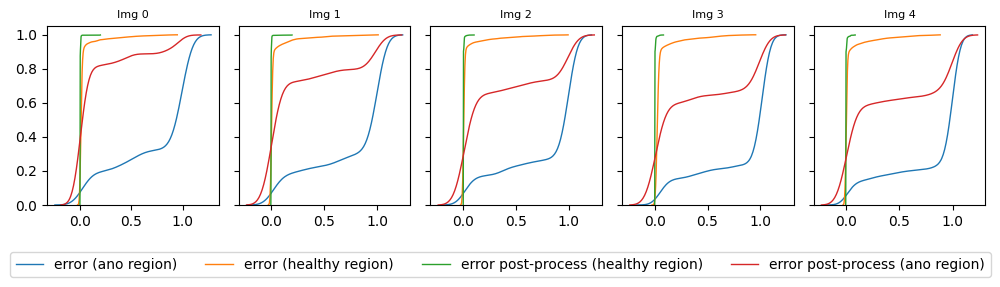

In [510]:
def filter_gt_ano_region(x, gt_mask):
    """
    Filter (flatten) tensor based on the ground truth mask. 
    Args: 
        x: torch.tensor(B, C, H, W)
        gt_mask: torch.tensor(B, C, H, W)

    Returns: 
        x_in: x values within the gt_mask region.
        x_out: x values outside of the gt_mask region. 
    """
    x = x.squeeze()
    gt_mask = gt_mask.squeeze()
    B = x.shape[0]
    gt_mask[gt_mask != 0] = 1
    x_in = []
    x_out = []
    for i in range(B):
        in_mask = gt_mask[i] != 0
        pin = x[i][in_mask]
        pout = x[i][~in_mask]

        x_in.append(pin.detach().cpu().numpy())
        x_out.append(pout.detach().cpu().numpy())
    return x_in, x_out

x0_ano_in, x0_ano_out = filter_gt_ano_region(x0_ano, img_ano_gt)
x_recon_mask_in, x_recon_mask_out = filter_gt_ano_region(x_recon_mask, img_ano_gt) 
fig = plot_kde_pixel(
    imgs=[x0_ano_out[5:], x_recon_mask_out[5:]],
    labels=["healthy region", "recon healthy region"],)

x_diff_in ,x_diff_out = filter_gt_ano_region(x_diff, img_ano_gt) 
x_diff_post_in ,x_diff_post_out = filter_gt_ano_region(torch.tensor(x_diff_post), img_ano_gt) 

fig = plot_kde_pixel(
    imgs=[x_diff_in[5:], x_diff_out[5:], x_diff_post_out[5:], x_diff_post_in[5:]],
    labels=["error (ano region)", "error (healthy region)", "error post-process (healthy region)", "error post-process (ano region)"],
    remove_zeros=False,
    plot_type="kde",
    cumulative=True)



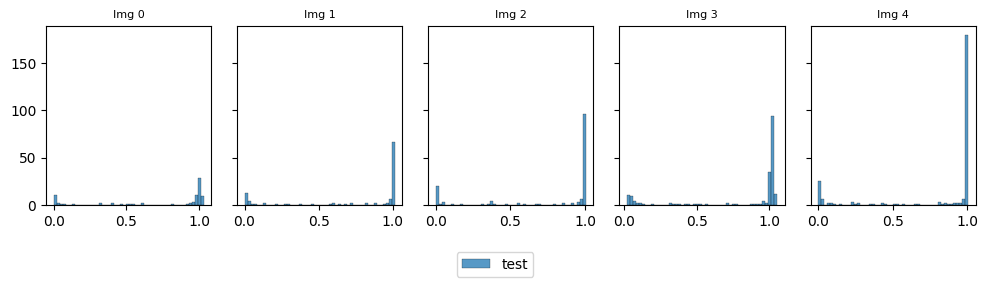

In [508]:
fig = plot_kde_pixel(
    imgs=[x_diff_in[5:]],
    labels=["test"],
    remove_zeros=True,
    plot_type="hist",
    cumulative=False)

False

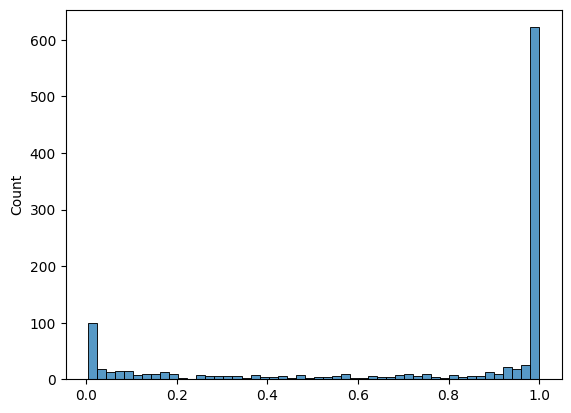

In [ ]:
test = x0_ano[9].squeeze().flatten()
test = test[test != 0]
import seaborn as sns

sns.histplot(test, bins=50, stat="count")



## Encode normal img using ano ysem

encoding loop time step: 100%|██████████| 10/10 [00:04<00:00,  2.27it/s]


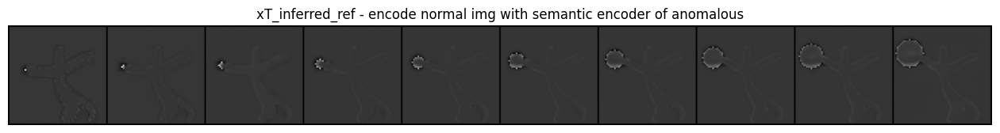

In [182]:
# Encode a normal image using ysem of anomalous 
# Here we choose randomly any healthy image
img_ref = x_hts[3]
img_ref = torch.tensor(img_ref, dtype=torch.float32).unsqueeze(1)

with torch.no_grad():
    xT_inferred_ref = gaussian_diffusion.representation_learning_diffae_encode(
        ddim_style="ddim10",
        encoder=ema_encoder,
        unet=ema_decoder,
        x_0=img_org,
        # z=ema_encoder(img_org),
        disable_tqdm=False
    )

# xT_inferred_ref = torch.clamp(xT_inferred_ref, -1, 1)
quick_plot_tensor(xT_inferred_ref, "xT_inferred_ref - encode normal img with semantic encoder of anomalous")

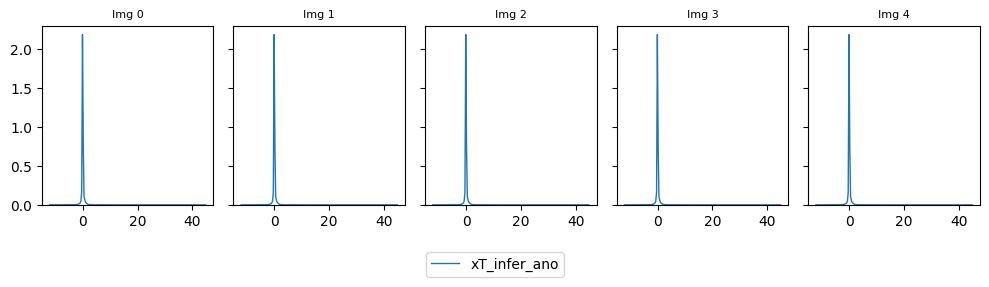

In [184]:
fig = plot_kde_pixel(
    [xT_inferred_ref],
    ["xT_infer_ano"]
)

We can see that stochastic encoder captures the fine grain details that the semantic encoder misses. We can exploit this fact to remove artifact from our anomalous image without losing the details, specially at the boundary of the image.

So the removal of subtle anomaly should be carried out within the latent space (semantic subcode and stochastic subcode), instead of relying entirely on applying Gaussian noise (with difference noise level) to original image.  

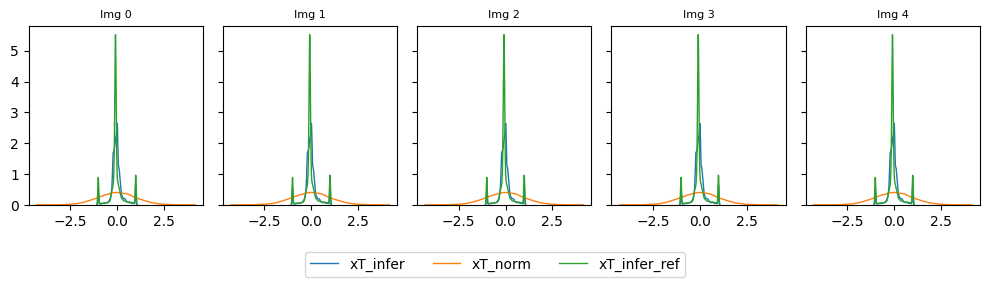

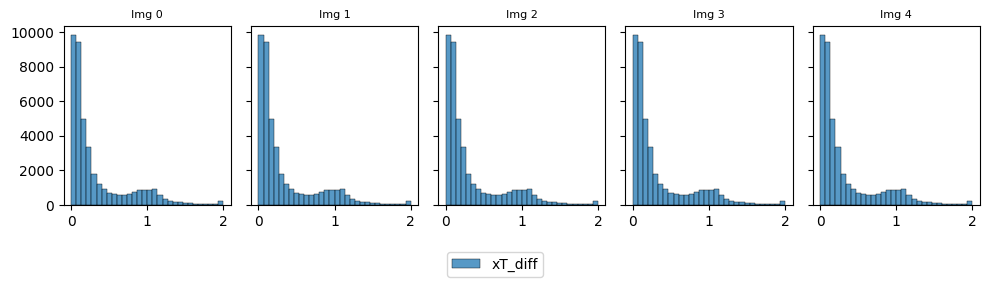

In [428]:
# Compare between xT_infer and xT_norm

xT_diff = torch.abs(xT_inferred - xT_inferred_ref)

fig = plot_kde_pixel(
    imgs=[xT_inferred, xT_norm, xT_inferred_ref],
    labels=["xT_infer", "xT_norm", "xT_infer_ref"]
)

fig = plot_kde_pixel(
    imgs=[xT_diff],
    labels=["xT_diff"],
    plot_type="hist",
    log_scale=False
)

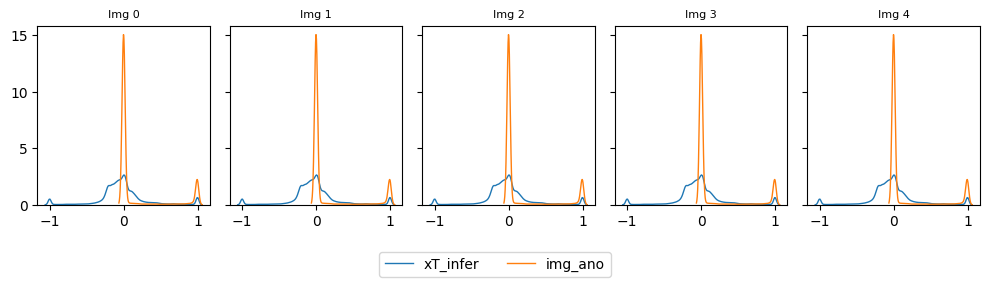

In [447]:
# Analyze the noise map distribution
added_noise_ano = xT_inferred - img_org
fig = plot_kde_pixel(imgs=[xT_inferred, img_org], labels=["xT_infer", "img_ano"])

### Use target anomalous image to stochastic encode all the previous image. 

In [435]:
from monai.utils import first

batch = first(test_loader)
target_idx = batch["target_idx"]
x = batch["x"]  # target image
x_prev = batch["x_prev"]
x_prev = rearrange(x_prev, "b t c h w -> (b t) c h w")

# Use x to encode prev image
with torch.no_grad():
    xT_prev_infer = gaussian_diffusion.representation_learning_diffae_encode(
        ddim_style="ddim100",
        encoder=ema_encoder,
        unet=ema_decoder,
        x_0=x_prev,
        z=ema_encoder(x),
        disable_tqdm=False
    )

encoding loop time step: 100%|██████████| 100/100 [00:33<00:00,  2.96it/s]


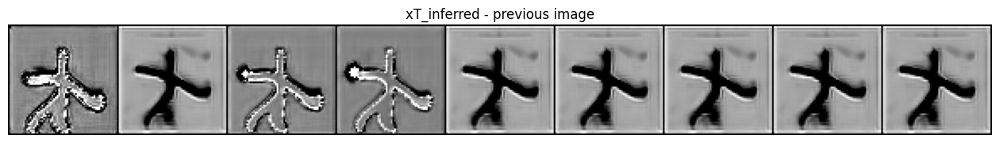

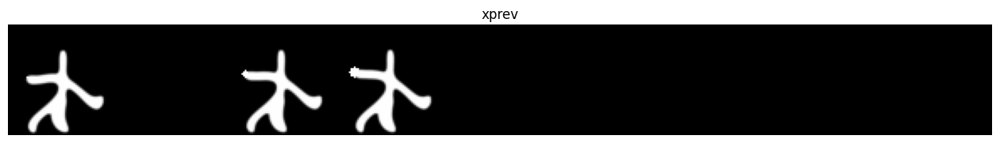

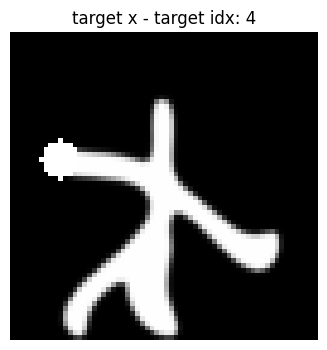

In [443]:
xT_prev_infer_clamp = torch.clamp(xT_prev_infer, -1, 1)
quick_plot_tensor(xT_prev_infer_clamp, "xT_inferred - previous image")
quick_plot_tensor(x_prev, "xprev")
quick_plot_tensor(x, f"target x - target idx: {target_idx.item()}")

sampling loop time step: 100%|██████████| 100/100 [00:34<00:00,  2.88it/s]


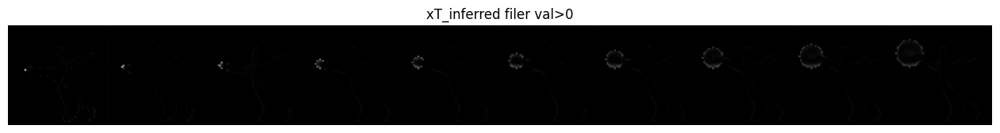

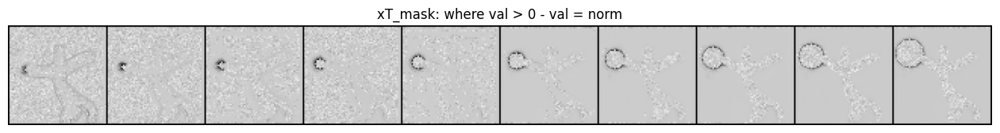

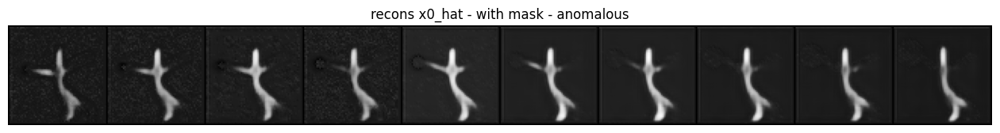

In [ ]:
test = torch.where(xT_diff > 0, xT_inferred, 0)
quick_plot_tensor(test, "xT_inferred filer val>0")

xT_mask = torch.where(xT_inferred > 0, xT_norm, xT_inferred)
quick_plot_tensor(xT_mask, "xT_mask: where val > 0 - val = norm")

# Decode from xT_mask using an img as reference

with torch.no_grad():
    x0_recon_mask = gaussian_diffusion.representation_learning_diffae_sample(
        ddim_style="ddim100",
        encoder=ema_encoder,
        unet=ema_decoder,
        x_0=img_org,
        x_T=xT_mask,
        disable_tqdm=False
    )

quick_plot_tensor(x0_recon_mask, "recons x0_hat - with mask - anomalous")

# Image manipulation

Following the DAE framework Preechakul et al. (2022) and LDAE framework , we perform linear interpolation in the semantic space and spherical linear interpolation in the stochastic one. Given two input scans x1 and x2, their corresponding semantic and stochastic representations are denoted as ys1em, z1  T and ys2em, z2  T , respectively. 

The interpolated latent representations at interpolation factor t ∈ [0, 1] are computed as:  LERP(y1  sem, y2  sem; t) = (1 − t) · y1  sem + t · y2  sem (12)  SLERP(z1  T , z2  T ; t) = sin((1 − t)θ)  sin(θ) z1  T + sin(tθ)  sin(θ) z2  T (13)  where the angle θ between z1  T and z2  T is given by:  θ = arccos      ⟨z1  T , z2  T⟩  ∥z1  T ∥ · ∥z2  T∥     (14